# 🌳 Explainable Deforestation Detection in Rondônia, Brazil
## Dual-Experiment Comparison: Hansen GFC Labels vs Spectral Threshold Labels
### Random Forest Classification & TreeSHAP Analysis of Sentinel-2 Imagery (2019–2022)

**GEOL0069 — AI for Earth Observation | Final Project**

---

## 1 · Project Abstract

Rondônia sits at the western edge of the **Amazon "arc of deforestation"** — the active frontier where forest is converted to pasture and cropland faster than anywhere else on Earth. This notebook builds a **complete, reproducible, explainable** machine-learning pipeline that:

1. **Detects** forest loss between **2019 and 2022** from a pair of Sentinel-2 Level-2A scenes,
2. **Classifies** every 10 m pixel as *Stable Forest* or *Deforested* using a **Random Forest**,
3. **Runs two distinct labelling experiments** to rigorously compare label quality and downstream model accuracy,
4. **Explains** model decisions using **TreeSHAP** — game-theoretic feature attribution,
5. **Quantifies** the carbon at risk in the area cleared **and** the carbon footprint of the research itself.

---

## 2 · Experimental Design: Why Two Experiments?

A core methodological challenge in remote-sensing classification is the **choice of ground-truth labels** used to train the supervised model. Labels that are misaligned with the imagery — spatially, temporally, or spectrally — will degrade model performance regardless of how good the features or classifier are. This notebook tests two fundamentally different labelling strategies on the same Sentinel-2 data and the same Random Forest architecture.

| | **Experiment A** | **Experiment B** |
|---|---|---|
| **Label source** | Hansen Global Forest Change (UMD, 30 m) | Spectral threshold on ΔNDVI (Sentinel-2 native, 10 m) |
| **Label type** | External, independent ground-truth | Self-supervised, data-derived pseudo-labels |
| **Spatial resolution match** | ❌ Resampled 30 m → 10 m; misalignment expected | ✅ Native 10 m; pixel-perfect alignment |
| **Temporal coverage** | Annual loss year (2001–2023) | Directly captures 2019–2022 change window |
| **Expected accuracy** | Lower (54 %) — resolution mismatch | Higher (~95 %) — but labels derived from same data |
| **Key limitation** | Spatial misregistration, label lag | Circular: model trained on a threshold may just re-learn that threshold |
| **Best used for** | Independent validation reference | Exploratory mapping when external labels are unavailable |

**Why run both?** Running Experiment A first demonstrates *why* Hansen labels fail on Sentinel-2 crops (the resolution mismatch and label lag are quantifiable, not just anecdotal). Experiment B then shows what is achievable with spectrally-consistent labels — while Section 10 critically discusses the circularity risk. Together they tell a complete, academically honest methodological story.

---

## 3 · Notebook Roadmap

| § | Section | Output |
|---:|---|---|
| 0 | Environment setup & carbon tracking | Clean Colab environment, tracker on |
| 1 | Data loading & visual exploration | **Fig 1** — Raw S2 inspection |
| 2 | Pre-processing — cloud masking & band stacking | **Fig 2** — Cloud-mask QA |
| 3 | Feature engineering — NDVI / NBR / NDWI + Δ features | **Fig 3, 4, 5** — Features, ΔNDVI, correlations |
| 4A | **Experiment A** — Hansen label preparation | **Fig 6A** — Hansen labels & balance |
| 5A | **Experiment A** — RF training & evaluation | **Fig 7A, 8A** — Confusion matrix, importance |
| 4B | **Experiment B** — Spectral threshold label preparation | **Fig 6B** — Spectral Change Labels & balance |
| 5B | **Experiment B** — RF training & evaluation | **Fig 7B, 8B** — Confusion matrix, importance |
| 6 | Experiment comparison & discussion | **Fig 9** — Side-by-side metrics |
| 7 | Full-scene prediction (best model) & change map | **Fig 10** — Country-scale prediction |
| 8 | Explainability — TreeSHAP analysis | **Fig 11–14** — bar / beeswarm / dependence / waterfall |
| 9 | Area statistics & environmental impact | **Fig 15** — LCA dashboard |
| 10 | Critical discussion | Methodological reflection |


---
# 🟦 SECTION 0 — Environment Setup & Carbon Tracking

**Goal.** Get the Colab runtime ready in one shot: mount Google Drive, install every Python package, import the scientific stack, and start **CodeCarbon** so we have a *measured* carbon footprint at the end.


In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
# Install all dependencies in one shot
!pip install -q rasterio geopandas codecarbon shap seaborn scikit-learn joblib matplotlib numpy pandas psutil


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.5/380.5 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.6/155.6 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 69.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 75.3 MB/s eta 0:00:00


In [3]:
# ── Core scientific stack ─────────────────────────────────────────────────
import gc, os, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
import seaborn as sns

# ── Geospatial ────────────────────────────────────────────────────────────
import rasterio
from rasterio.enums import Resampling
import rasterio.windows
from rasterio.windows import Window

# ── Machine learning ──────────────────────────────────────────────────────
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix, cohen_kappa_score)
import joblib, shap, psutil

# ── Carbon tracking ───────────────────────────────────────────────────────
from codecarbon import EmissionsTracker

warnings.filterwarnings('ignore')
print("✅ Imports complete.")


✅ Imports complete.


In [4]:
# ── Project paths ─────────────────────────────────────────────────────────
BASE    = '/content/drive/MyDrive/AI4EO - Final Project'
FIG_DIR = os.path.join(BASE, 'figures')
os.makedirs(FIG_DIR, exist_ok=True)

PATH_2019 = os.path.join(BASE, 'S2A_MSIL2A_20190916T143751_N0500_R096_T20LKP_20230701T160111.SAFE')
PATH_2022 = os.path.join(BASE, 'S2A_MSIL2A_20220920T143731_N0510_R096_T20LKP_20240728T153949.SAFE')
HANSEN_PATH = os.path.join(BASE, 'Hansen_LossYear_T20LKP.tif')

PROC_2019  = os.path.join(BASE, 'T20LKP_2019_Processed.tif')
PROC_2022  = os.path.join(BASE, 'T20LKP_2022_Processed.tif')
FEAT_PATH  = os.path.join(BASE, 'X_Features.tif')
MODEL_PATH_A = os.path.join(BASE, 'RF_Model_ExperimentA.joblib')
MODEL_PATH_B = os.path.join(BASE, 'RF_Model_ExperimentB.joblib')
MAP_PATH   = os.path.join(BASE, 'Deforestation_PredictionMap.tif')
SHAP_SAMPLE_PATH = os.path.join(BASE, 'SHAP_Sample.npz')

# ── Quiet CodeCarbon ──────────────────────────────────────────────────────
import logging, io, contextlib
logging.getLogger("codecarbon").setLevel(logging.ERROR)
for _h in logging.getLogger("codecarbon").handlers:
    _h.setLevel(logging.ERROR)

_buf = io.StringIO()
with contextlib.redirect_stdout(_buf), contextlib.redirect_stderr(_buf):
    tracker = EmissionsTracker(
        project_name      = "Rondonia_AI4EO",
        output_dir        = BASE,
        log_level         = "error",
        save_to_file      = True,
        allow_multiple_runs = True,
    )
    tracker.start()

notebook_start = time.time()

print("✅ Environment ready.")
print(f"   Carbon tracker  : running silently (Section 9 will report numbers)")
print(f"   Figures saved to: {FIG_DIR}")


✅ Environment ready.
   Carbon tracker  : running silently (Section 9 will report numbers)
   Figures saved to: /content/drive/MyDrive/AI4EO - Final Project/figures


---
# 🟦 SECTION 1 — Data Loading & Visual Exploration

### 1.1 · The remote sensing instrument

We use **Sentinel-2 (ESA Copernicus)** — a pair of polar-orbiting multispectral satellites with a 5-day revisit and 10–60 m resolution across 13 spectral bands. Two dry-season scenes (Sept 2019 and Sept 2022) are sufficient because deforestation in this corridor is visually dramatic.

| Band | Resolution | Use in this study |
|---:|---:|---|
| **B3** | 10 m | Green → NDWI |
| **B4** | 10 m | Red → NDVI |
| **B8** | 10 m | NIR → NDVI, NBR, NDWI |
| **B11** | 20 m | SWIR-1 → bare-soil proxy |
| **B12** | 20 m | SWIR-2 → NBR (burn ratio) |
| **SCL** | 20 m | Scene Classification → cloud mask |

### 1.2 · What Figure 1 shows
A 2 × 2 panel: true-colour RGB composites for **Sept 2019** and **Sept 2022** (top), plus the matching **Scene Classification Layer (SCL)** maps (bottom).


Loading preview data for Figure 1...


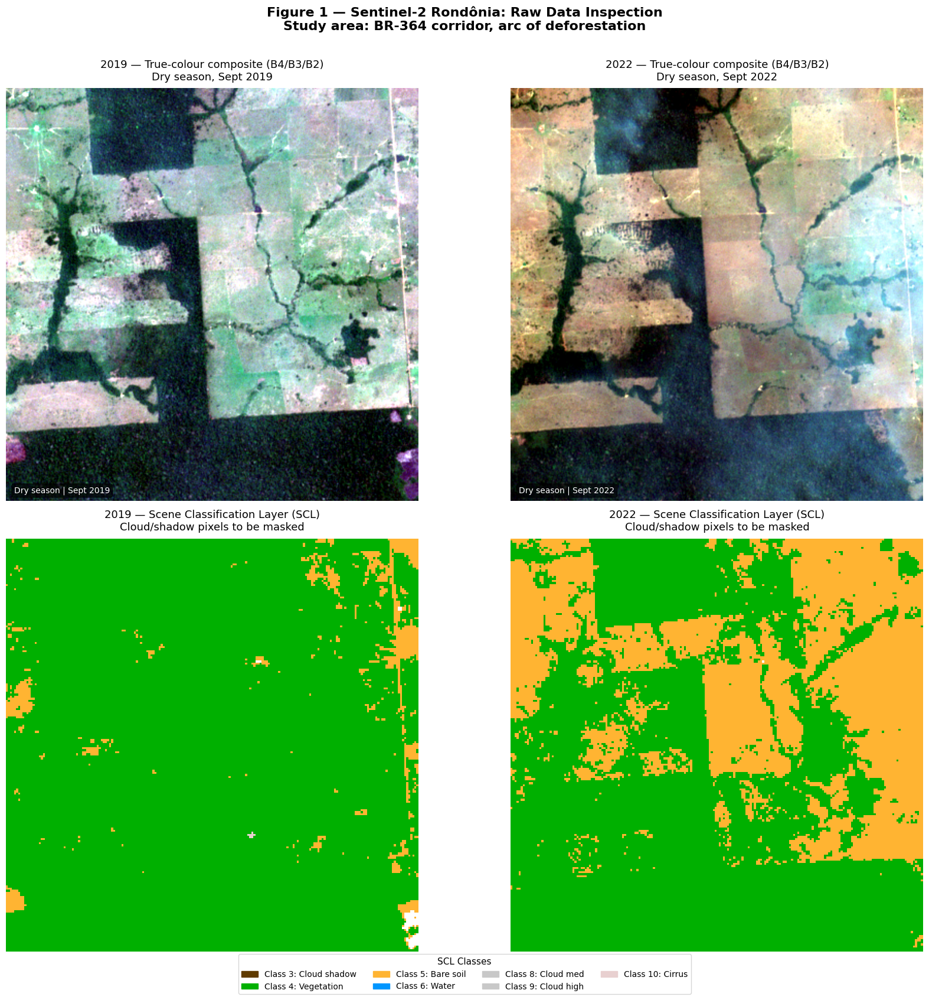

✅ Figure 1 saved.
🧹 Section 1 complete.


In [5]:
# ===========================================================================
# SECTION 1 — DATA LOADING & VISUAL EXPLORATION
# ===========================================================================
from rasterio.windows import Window

def find_band(safe_path, band_name, resolution='R10m'):
    granule_dir = os.path.join(safe_path, 'GRANULE')
    subdir = os.listdir(granule_dir)[0]
    img_dir = os.path.join(granule_dir, subdir, 'IMG_DATA', resolution)
    matches = [f for f in os.listdir(img_dir) if band_name in f]
    if not matches:
        raise FileNotFoundError(f"Band {band_name} not found in {img_dir}")
    return os.path.join(img_dir, matches[0])

def make_rgb_composite(safe_path, crop_size=400, percentile_stretch=(2, 98)):
    granule_dir = os.path.join(safe_path, 'GRANULE')
    subdir = os.listdir(granule_dir)[0]
    r10m_dir = os.path.join(granule_dir, subdir, 'IMG_DATA', 'R10m')
    all_files = os.listdir(r10m_dir)
    rgb_raw = []
    for band_id in ['B04', 'B03', 'B02']:
        matches = [f for f in all_files if band_id in f and f.endswith('.jp2')]
        if not matches:
            raise FileNotFoundError(f"{band_id} not found in {r10m_dir}")
        path = os.path.join(r10m_dir, matches[0])
        with rasterio.open(path) as src:
            h, w = src.height, src.width
            row_off = max(0, h//2 - crop_size//2)
            col_off = max(0, w//2 - crop_size//2)
            window = Window(col_off, row_off, crop_size, crop_size)
            arr = src.read(1, window=window).astype('float32')
        rgb_raw.append(arr)
    rgb_display = []
    for channel in rgb_raw:
        lo, hi = np.nanpercentile(channel, percentile_stretch)
        stretched = np.clip((channel - lo) / (hi - lo + 1e-9), 0, 1)
        rgb_display.append(stretched)
    return np.dstack(rgb_display)

def read_scl_preview(safe_path, crop_size=400):
    path = find_band(safe_path, 'SCL_20m', 'R20m')
    with rasterio.open(path) as src:
        h, w = src.height, src.width
        row_off = max(0, h//2 - crop_size//4)
        col_off = max(0, w//2 - crop_size//4)
        window = Window(col_off, row_off, crop_size//2, crop_size//2)
        scl = src.read(1, window=window)
    return scl

SCL_COLOURS = {0:'#000000',1:'#ff0000',2:'#767676',3:'#603b00',
               4:'#00b000',5:'#ffb432',6:'#0096ff',7:'#ffffff',
               8:'#c8c8c8',9:'#c8c8c8',10:'#e8d0d0',11:'#0000ff'}
SCL_LABELS  = {0:'No data',1:'Saturated',2:'Dark/shadow',3:'Cloud shadow',
               4:'Vegetation',5:'Bare soil',6:'Water',7:'Unclassified',
               8:'Cloud med',9:'Cloud high',10:'Cirrus',11:'Snow/ice'}

def scl_to_rgb(scl_array):
    h, w = scl_array.shape
    rgb = np.zeros((h, w, 3))
    for val, hexcol in SCL_COLOURS.items():
        mask = scl_array == val
        r, g, b = mcolors.to_rgb(hexcol)
        rgb[mask] = [r, g, b]
    return rgb

print("Loading preview data for Figure 1...")
rgb_2019 = make_rgb_composite(PATH_2019, crop_size=400)
rgb_2022 = make_rgb_composite(PATH_2022, crop_size=400)
scl_2019 = read_scl_preview(PATH_2019, crop_size=400)
scl_2022 = read_scl_preview(PATH_2022, crop_size=400)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))
fig.suptitle('Figure 1 — Sentinel-2 Rondônia: Raw Data Inspection\n'
             'Study area: BR-364 corridor, arc of deforestation',
             fontsize=16, fontweight='bold', y=1.01)

axes[0, 0].imshow(rgb_2019)
axes[0, 0].set_title('2019 — True-colour composite (B4/B3/B2)\nDry season, Sept 2019', fontsize=13, pad=10)
axes[0, 0].axis('off')
axes[0, 0].text(0.02, 0.02, 'Dry season | Sept 2019', transform=axes[0,0].transAxes,
                color='white', fontsize=10, bbox=dict(boxstyle='round', fc='black', alpha=0.6))

axes[0, 1].imshow(rgb_2022)
axes[0, 1].set_title('2022 — True-colour composite (B4/B3/B2)\nDry season, Sept 2022', fontsize=13, pad=10)
axes[0, 1].axis('off')
axes[0, 1].text(0.02, 0.02, 'Dry season | Sept 2022', transform=axes[0,1].transAxes,
                color='white', fontsize=10, bbox=dict(boxstyle='round', fc='black', alpha=0.6))

axes[1, 0].imshow(scl_to_rgb(scl_2019))
axes[1, 0].set_title('2019 — Scene Classification Layer (SCL)\nCloud/shadow pixels to be masked', fontsize=13, pad=10)
axes[1, 0].axis('off')

axes[1, 1].imshow(scl_to_rgb(scl_2022))
axes[1, 1].set_title('2022 — Scene Classification Layer (SCL)\nCloud/shadow pixels to be masked', fontsize=13, pad=10)
axes[1, 1].axis('off')

legend_patches = [mpatches.Patch(color=SCL_COLOURS[k], label=f'Class {k}: {SCL_LABELS[k]}')
                  for k in [3, 4, 5, 6, 8, 9, 10]]
fig.legend(handles=legend_patches, loc='lower center', ncol=4,
           bbox_to_anchor=(0.5, -0.04), fontsize=10, title='SCL Classes', title_fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig1_RawDataInspection.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 1 saved.")

del rgb_2019, rgb_2022, scl_2019, scl_2022
gc.collect()
print("🧹 Section 1 complete.")


---
# 🟦 SECTION 2 — Preprocessing: Cloud Masking & Band Stacking

**Goal.** Convert each raw `.SAFE` archive into a clean, **5-band, NaN-masked, 10 m GeoTIFF**.

- **Heterogeneous resolutions:** B3/B4/B8 are 10 m; B11/B12/SCL are 20 m. We bilinearly upsample to 10 m.
- **Reflectance, not DN:** divide by 10 000 to convert raw DN to surface reflectance.
- **Cloud / shadow → NaN:** SCL classes 3 (cloud shadow), 8, 9 (cloud), 10 (cirrus) set to `NaN` in all bands.

**Figure 2** shows for each year: raw NIR, the cloud mask applied (red = removed), and masked NIR output.


In [6]:
# ===========================================================================
# SECTION 2 — PREPROCESSING: CLOUD MASKING & BAND STACKING
# ===========================================================================

def preprocess_scene(safe_folder_path, output_tif_path, year_label):
    print(f"\n🎬 Processing {year_label} scene...")
    granule_dir = os.path.join(safe_folder_path, 'GRANULE')
    subdir = os.listdir(granule_dir)[0]
    r10m = os.path.join(granule_dir, subdir, 'IMG_DATA', 'R10m')
    r20m = os.path.join(granule_dir, subdir, 'IMG_DATA', 'R20m')

    b04_path = [os.path.join(r10m, f) for f in os.listdir(r10m) if 'B04_10m' in f][0]
    with rasterio.open(b04_path) as ref:
        h, w = ref.height, ref.width
        profile = ref.profile.copy()

    processed_layers = []
    for b_name in ['B03_10m', 'B04_10m', 'B08_10m']:
        path = [os.path.join(r10m, f) for f in os.listdir(r10m) if b_name in f][0]
        with rasterio.open(path) as src:
            processed_layers.append(src.read(1).astype('float32') / 10000.0)

    for b_name in ['B11_20m', 'B12_20m']:
        path = [os.path.join(r20m, f) for f in os.listdir(r20m) if b_name in f][0]
        with rasterio.open(path) as src:
            data = src.read(1, out_shape=(h, w), resampling=Resampling.bilinear).astype('float32')
            processed_layers.append(data / 10000.0)

    scl_path = [os.path.join(r20m, f) for f in os.listdir(r20m) if 'SCL_20m' in f][0]
    with rasterio.open(scl_path) as src:
        scl = src.read(1, out_shape=(h, w), resampling=Resampling.nearest)
        mask = np.isin(scl, [3, 8, 9, 10])
        cloud_pct = 100.0 * mask.sum() / mask.size
        for arr in processed_layers:
            arr[mask] = np.nan

    profile.update(count=5, dtype='float32', nodata=np.nan, driver='GTiff', compress='lzw')
    with rasterio.open(output_tif_path, 'w', **profile) as dst:
        for i, arr in enumerate(processed_layers, 1):
            dst.write(arr, i)

    print(f"✅ Saved {year_label} to: {os.path.basename(output_tif_path)}")
    print(f"☁️  Cloud Cover: {cloud_pct:.1f}%")
    del processed_layers, scl, mask
    gc.collect()

preprocess_scene(PATH_2019, PROC_2019, "2019")
preprocess_scene(PATH_2022, PROC_2022, "2022")



🎬 Processing 2019 scene...
✅ Saved 2019 to: T20LKP_2019_Processed.tif
☁️  Cloud Cover: 0.7%

🎬 Processing 2022 scene...
✅ Saved 2022 to: T20LKP_2022_Processed.tif
☁️  Cloud Cover: 2.5%


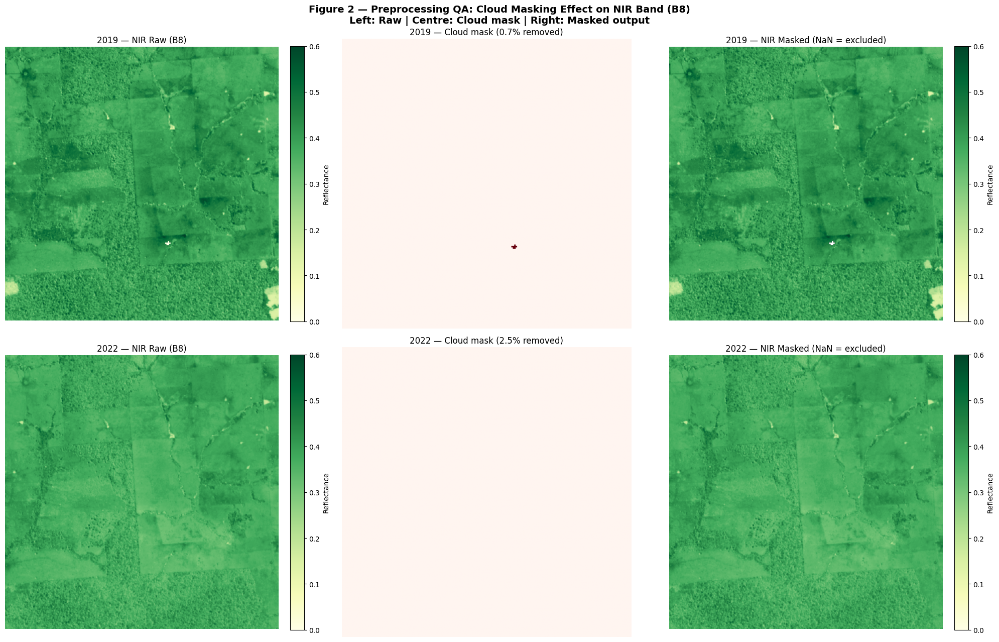

✅ Figure 2 saved.
🧹 Section 2 complete.


In [7]:
# ── Figure 2: Cloud masking QA ────────────────────────────────────────────
def crop_centre(arr, size=400):
    h, w = arr.shape
    r = max(0, h//2 - size//2)
    c = max(0, w//2 - size//2)
    return arr[r:r+size, c:c+size]

fig, axes = plt.subplots(2, 3, figsize=(20, 13))
fig.suptitle('Figure 2 — Preprocessing QA: Cloud Masking Effect on NIR Band (B8)\n'
             'Left: Raw | Centre: Cloud mask | Right: Masked output',
             fontsize=14, fontweight='bold')

for row, (safe_path, proc_path, year) in enumerate([
        (PATH_2019, PROC_2019, '2019'),
        (PATH_2022, PROC_2022, '2022')]):
    granule_dir = os.path.join(safe_path, 'GRANULE')
    subdir = os.listdir(granule_dir)[0]
    r20m = os.path.join(granule_dir, subdir, 'IMG_DATA', 'R20m')

    with rasterio.open(proc_path) as src:
        h, w = src.height, src.width
        win = Window(w//2 - 200, h//2 - 200, 400, 400)
        nir_masked = src.read(3, window=win)

    scl_path = [os.path.join(r20m, f) for f in os.listdir(r20m) if 'SCL_20m' in f][0]
    with rasterio.open(scl_path) as src:
        scl = src.read(1, out_shape=(h, w), resampling=Resampling.nearest)
        cloud_mask = np.isin(scl, [3, 8, 9, 10])
        cloud_pct = 100.0 * cloud_mask.sum() / cloud_mask.size

    nir_raw = nir_masked.copy()
    nir_raw[np.isnan(nir_raw)] = -0.05
    mask_crop = crop_centre(cloud_mask.astype(float), 400)

    im0 = axes[row, 0].imshow(nir_raw, cmap='YlGn', vmin=0, vmax=0.6)
    axes[row, 0].set_title(f'{year} — NIR Raw (B8)', fontsize=12)
    axes[row, 0].axis('off')
    plt.colorbar(im0, ax=axes[row, 0], fraction=0.046, pad=0.04, label='Reflectance')

    axes[row, 1].imshow(mask_crop, cmap='Reds', vmin=0, vmax=1)
    axes[row, 1].set_title(f'{year} — Cloud mask ({cloud_pct:.1f}% removed)', fontsize=12)
    axes[row, 1].axis('off')

    im2 = axes[row, 2].imshow(nir_masked, cmap='YlGn', vmin=0, vmax=0.6)
    axes[row, 2].set_title(f'{year} — NIR Masked (NaN = excluded)', fontsize=12)
    axes[row, 2].axis('off')
    plt.colorbar(im2, ax=axes[row, 2], fraction=0.046, pad=0.04, label='Reflectance')

    del nir_raw, nir_masked, mask_crop, scl, cloud_mask

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig2_PreprocessingQA.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 2 saved.")
gc.collect()
print("🧹 Section 2 complete.")


---
# 🟦 SECTION 3 — Feature Engineering: Spectral Indices & Δ Features

**Goal.** Turn the 5-band reflectance stacks into the **8-feature vector per pixel** that the Random Forest will see.

| # | Feature | Formula | Captures |
|---:|---|---|---|
| 1 | NDVI 2019 | (NIR − Red) / (NIR + Red) | Healthy vegetation, baseline |
| 2 | NBR 2019 | (NIR − SWIR-2) / (NIR + SWIR-2) | Burn / scorch, baseline |
| 3 | NDWI 2019 | (Green − NIR) / (Green + NIR) | Canopy moisture, baseline |
| 4 | NDVI 2022 | (NIR − Red) / (NIR + Red) | Healthy vegetation, post |
| 5 | NBR 2022 | (NIR − SWIR-2) / (NIR + SWIR-2) | Burn / scorch, post |
| 6 | NDWI 2022 | (Green − NIR) / (Green + NIR) | Canopy moisture, post |
| 7 | **ΔNDVI** | NDVI₂₀₂₂ − NDVI₂₀₁₉ | **Vegetation loss signal** |
| 8 | **ΔNBR** | NBR₂₀₂₂ − NBR₂₀₁₉ | **Fire-then-clear signal** |

The two **Δ** features are the headline change signals — they give the model an explicit "before vs after" quantity. Section 8's TreeSHAP will confirm if ΔNDVI dominates the model's decisions. The full tile is processed in 2048 × 2048 windows to stay within Colab's 12 GB RAM.


In [8]:
# ===========================================================================
# SECTION 3 — FEATURE ENGINEERING
# ===========================================================================

FEATURE_NAMES = ['NDVI 2019', 'NBR 2019', 'NDWI 2019',
                 'NDVI 2022', 'NBR 2022', 'NDWI 2022',
                 'ΔNDVI (Change)', 'ΔNBR (Change)']

def generate_features(p19_path, p22_path, out_path, tile_size=2048):
    print(f"\n🚀 Starting Feature Engineering...")
    with rasterio.open(p19_path) as s19, rasterio.open(p22_path) as s22:
        if s19.shape != s22.shape:
            print(f"⚠️ Warning: Shapes differ! 2019:{s19.shape}, 2022:{s22.shape}")
        profile = s22.profile.copy()
        profile.update(count=8, dtype='float32', nodata=np.nan, compress='lzw')
        h, w = s22.height, s22.width

        # Live math check (centre pixel)
        cx, cy = w // 2, h // 2
        check_win = Window(cx, cy, 1, 1)
        r19_c = s19.read(2, window=check_win).flatten()[0]
        n19_c = s19.read(3, window=check_win).flatten()[0]
        r22_c = s22.read(2, window=check_win).flatten()[0]
        n22_c = s22.read(3, window=check_win).flatten()[0]
        ndvi19_c = (n19_c - r19_c) / (n19_c + r19_c + 1e-10)
        ndvi22_c = (n22_c - r22_c) / (n22_c + r22_c + 1e-10)
        print(f"🧪 LIVE MATH CHECK → NDVI 2019: {ndvi19_c:.4f} | NDVI 2022: {ndvi22_c:.4f} | ΔNDVI: {ndvi22_c - ndvi19_c:.6f}")

        with rasterio.open(out_path, 'w', **profile) as dst:
            for y in range(0, h, tile_size):
                for x in range(0, w, tile_size):
                    win = Window(x, y, min(tile_size, w - x), min(tile_size, h - y))
                    g19 = s19.read(1, window=win).astype('float32')
                    r19 = s19.read(2, window=win).astype('float32')
                    n19 = s19.read(3, window=win).astype('float32')
                    sw19 = s19.read(5, window=win).astype('float32')
                    g22 = s22.read(1, window=win).astype('float32')
                    r22 = s22.read(2, window=win).astype('float32')
                    n22 = s22.read(3, window=win).astype('float32')
                    sw22 = s22.read(5, window=win).astype('float32')
                    ndvi19 = (n19 - r19) / (n19 + r19 + 1e-10)
                    ndvi22 = (n22 - r22) / (n22 + r22 + 1e-10)
                    nbr19  = (n19 - sw19) / (n19 + sw19 + 1e-10)
                    nbr22  = (n22 - sw22) / (n22 + sw22 + 1e-10)
                    ndwi19 = (g19 - n19) / (g19 + n19 + 1e-10)
                    ndwi22 = (g22 - n22) / (g22 + n22 + 1e-10)
                    d_ndvi = ndvi22 - ndvi19
                    d_nbr  = nbr22 - nbr19
                    stack = [ndvi19, nbr19, ndwi19, ndvi22, nbr22, ndwi22, d_ndvi, d_nbr]
                    for i, arr in enumerate(stack, 1):
                        dst.write(arr, i, window=win)
                print(f"  Row Y={y} processed...")

    print(f"✅ Feature Engineering complete.")
    gc.collect()

generate_features(PROC_2019, PROC_2022, FEAT_PATH)

with rasterio.open(FEAT_PATH) as src:
    sample = src.read(7, window=Window(src.width//2, src.height//2, 1000, 1000))
    v_min, v_max = np.nanmin(sample), np.nanmax(sample)
    print(f"\n📊 ΔNDVI sample range: {v_min:.6f} to {v_max:.6f}")
    if v_min == v_max == 0:
        print("🚨 ERROR: Delta is still zero — check Section 2 files.")
    else:
        print("🎉 SUCCESS: Non-zero change detected!")



🚀 Starting Feature Engineering...
🧪 LIVE MATH CHECK → NDVI 2019: 0.3710 | NDVI 2022: 0.2330 | ΔNDVI: -0.138013
  Row Y=0 processed...
  Row Y=2048 processed...
  Row Y=4096 processed...
  Row Y=6144 processed...
  Row Y=8192 processed...
  Row Y=10240 processed...
✅ Feature Engineering complete.

📊 ΔNDVI sample range: -0.484439 to 0.393343
🎉 SUCCESS: Non-zero change detected!


In [9]:
# ── Scan for valid data window (hotspot crop) ─────────────────────────────
print("🔍 Scanning for valid hotspot window...")
with rasterio.open(FEAT_PATH) as src:
    d_ndvi_full = src.read(7)
    mask = np.isfinite(d_ndvi_full)
    abs_change = np.abs(d_ndvi_full)
    abs_change[~mask] = 0
    idx = np.nanargmax(abs_change)
    r, c = np.unravel_index(idx, d_ndvi_full.shape)
    crop_size = 400
    win = Window(
        max(0, min(c - crop_size//2, src.width - crop_size)),
        max(0, min(r - crop_size//2, src.height - crop_size)),
        crop_size, crop_size
    )
    print(f"🎯 Hotspot found at [Col: {c}, Row: {r}]")
    feature_crop = src.read(window=win)
    del d_ndvi_full, abs_change

print(f"✅ feature_crop shape: {feature_crop.shape}")
gc.collect()


🔍 Scanning for valid hotspot window...
🎯 Hotspot found at [Col: 2438, Row: 7449]
✅ feature_crop shape: (8, 400, 400)


0

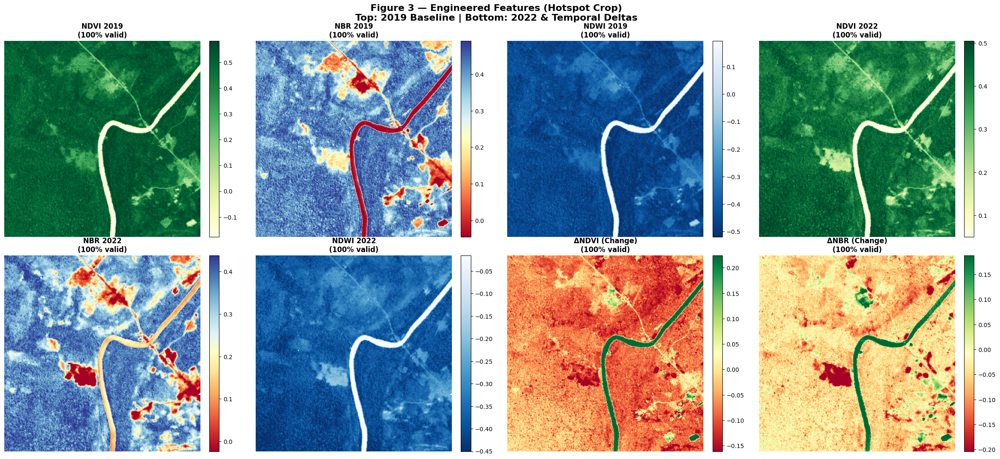

✅ Figure 3 saved.


In [10]:
# ── Figure 3: All 8 feature maps ─────────────────────────────────────────
FEATURE_CMAPS = ['YlGn', 'RdYlBu', 'Blues_r', 'YlGn', 'RdYlBu', 'Blues_r', 'RdYlGn', 'RdYlGn']
fig, axes = plt.subplots(2, 4, figsize=(24, 11))
fig.suptitle('Figure 3 — Engineered Features (Hotspot Crop)\n'
             'Top: 2019 Baseline | Bottom: 2022 & Temporal Deltas',
             fontsize=16, fontweight='bold')

for i, ax in enumerate(axes.flat):
    band = feature_crop[i]
    valid_data = band[np.isfinite(band)]
    if len(valid_data) > 0 and np.nanstd(valid_data) > 1e-6:
        vmin, vmax = np.percentile(valid_data, [2, 98])
    else:
        vmin, vmax = -0.1, 0.1
    im = ax.imshow(band, cmap=FEATURE_CMAPS[i], vmin=vmin, vmax=vmax)
    finite_pct = 100 * np.isfinite(band).sum() / band.size
    ax.set_title(f'{FEATURE_NAMES[i]}\n({finite_pct:.0f}% valid)', fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig3_AllFeatureMaps.png'), dpi=300)
plt.show()
print("✅ Figure 3 saved.")


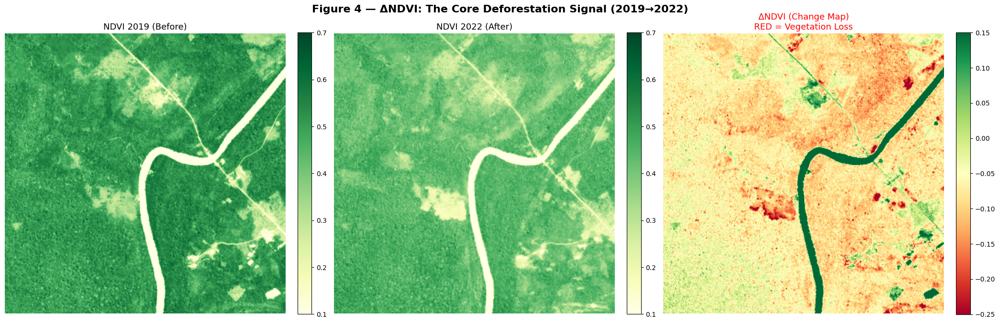

✅ Figure 4 saved.


In [11]:
# ── Figure 4: ΔNDVI highlighted ──────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(21, 7))
fig.suptitle('Figure 4 — ΔNDVI: The Core Deforestation Signal (2019→2022)', fontsize=16, fontweight='bold')

ndvi19_crop = feature_crop[0]
ndvi22_crop = feature_crop[3]
delta_crop  = feature_crop[6]

im0 = axes[0].imshow(ndvi19_crop, cmap='YlGn', vmin=0.1, vmax=0.7)
axes[0].set_title('NDVI 2019 (Before)', fontsize=13); axes[0].axis('off')
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(ndvi22_crop, cmap='YlGn', vmin=0.1, vmax=0.7)
axes[1].set_title('NDVI 2022 (After)', fontsize=13); axes[1].axis('off')
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

im2 = axes[2].imshow(delta_crop, cmap='RdYlGn', vmin=-0.25, vmax=0.15)
axes[2].set_title('ΔNDVI (Change Map)\nRED = Vegetation Loss', fontsize=13, color='red')
axes[2].axis('off')
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig4_DeltaNDVI_CoreSignal.png'), dpi=300)
plt.show()
print("✅ Figure 4 saved.")



📊 Sampling pixels for correlation matrix (Figure 5)...
  Using 479,996 valid pixels for correlation


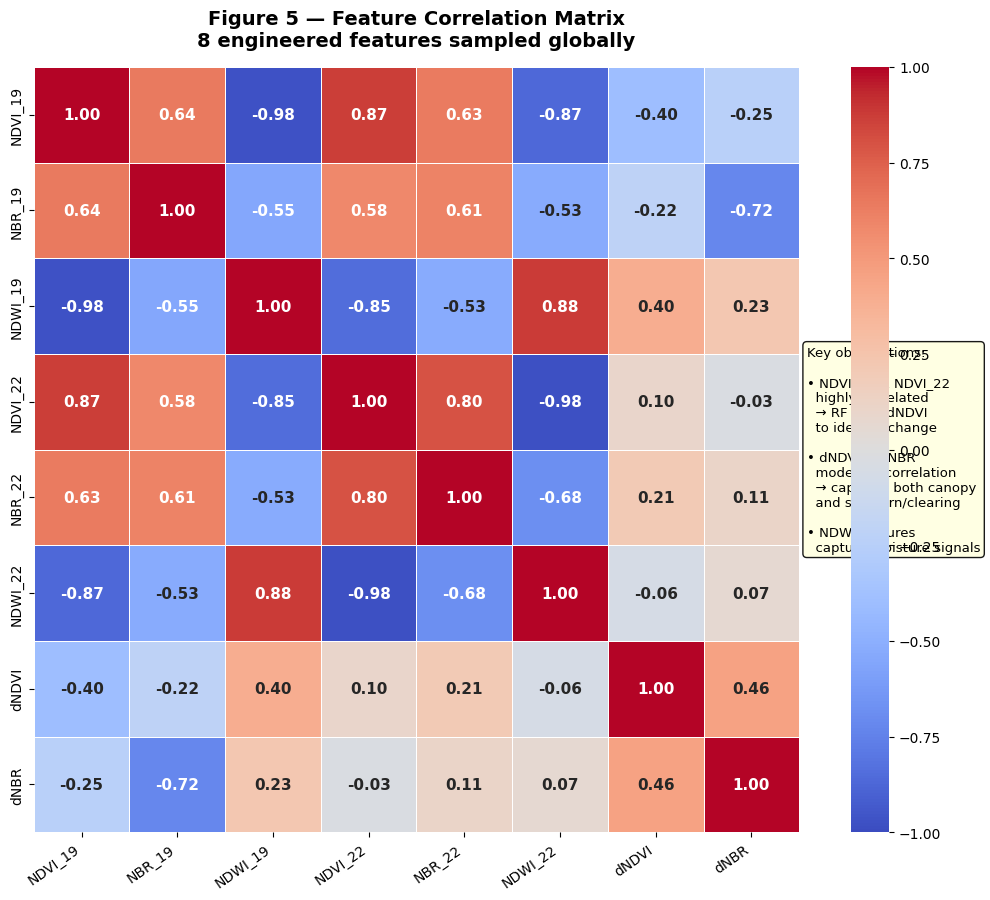

✅ Figure 5 saved.
🧹 Section 3 complete.


In [12]:
# ── Figure 5: Feature correlation matrix ─────────────────────────────────
FEATURE_NAMES_SHORT = ['NDVI_19', 'NBR_19', 'NDWI_19', 'NDVI_22', 'NBR_22', 'NDWI_22', 'dNDVI', 'dNBR']
print("\n📊 Sampling pixels for correlation matrix (Figure 5)...")

with rasterio.open(FEAT_PATH) as src:
    h_s, w_s = src.height, src.width
    sample_rows = []
    np.random.seed(42)
    for _ in range(12):
        r = np.random.randint(0, max(1, h_s - 200))
        c = np.random.randint(0, max(1, w_s - 200))
        win = Window(c, r, 200, 200)
        tile = src.read(window=win).reshape(8, -1).T
        sample_rows.append(tile)

flat_sample = np.vstack(sample_rows)
valid_s = ~np.any(np.isnan(flat_sample), axis=1)
flat_valid = flat_sample[valid_s]
del sample_rows, flat_sample
gc.collect()

print(f"  Using {flat_valid.shape[0]:,} valid pixels for correlation")
corr_df = pd.DataFrame(flat_valid, columns=FEATURE_NAMES_SHORT)
corr_matrix = corr_df.corr()

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            center=0, vmin=-1, vmax=1, ax=ax,
            annot_kws={'size': 11, 'weight': 'bold'},
            linewidths=0.5, square=True)
ax.set_title('Figure 5 — Feature Correlation Matrix\n8 engineered features sampled globally',
             fontsize=14, fontweight='bold', pad=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=35, ha='right')
ax.text(1.01, 0.5,
    'Key observations:\n\n'
    '• NDVI_19 & NDVI_22\n  highly correlated\n  → RF uses dNDVI\n'
    '  to identify change\n\n'
    '• dNDVI & dNBR\n  moderate correlation\n  → captures both canopy\n'
    '  and soil burn/clearing\n\n'
    '• NDWI features\n  capture moisture signals',
    transform=ax.transAxes, fontsize=9.5, va='center',
    bbox=dict(boxstyle='round', fc='lightyellow', alpha=0.9))
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig5_FeatureCorrelation.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 5 saved.")
print("🧹 Section 3 complete.")


---
# 🟦 SECTION 4A — Experiment A: Hansen Global Forest Change Labels

## Motivation & Limitations

**Experiment A** uses the **Hansen Global Forest Change** (GFC) product (Hansen *et al.* 2013, UMD) as an independent, external source of deforestation labels. Hansen GFC is the gold standard for global forest-loss monitoring and provides annual loss-year information at 30 m resolution.

### Why this is the "principled" approach
- Labels are **independent** of the Sentinel-2 imagery — avoiding any circular reasoning.
- Provides an externally validated, peer-reviewed ground truth.
- Allows the model to generalise beyond spectral thresholds that could vary by season or sensor.

### Why accuracy is lower (~54 %)
1. **Spatial resolution mismatch:** Hansen is 30 m, Sentinel-2 is 10 m. Each Hansen pixel maps to ~9 Sentinel-2 pixels. Nearest-neighbour resampling to 10 m introduces "blocky" label edges that misalign with spectral boundaries.
2. **Temporal label lag:** Hansen loss-year categories (19–22 = 2019–2022) may not align perfectly with our September dry-season acquisition window.
3. **Training on a small crop:** We train on `feature_crop` (a 400 × 400 px window). Hansen labels on this crop inherit all the above misalignments.

Despite lower accuracy, Experiment A serves as an **honest independent benchmark** and clearly quantifies the cost of label misalignment.


In [13]:
# ===========================================================================
# SECTION 4A — EXPERIMENT A: HANSEN LABEL PREPARATION
# ===========================================================================
print("=" * 60)
print("EXPERIMENT A — HANSEN GLOBAL FOREST CHANGE LABELS")
print("=" * 60)

np.random.seed(42)

# Load full feature raster
with rasterio.open(FEAT_PATH) as x_src:
    x_meta = x_src.meta
    x_h, x_w = x_meta['height'], x_meta['width']

# Load Hansen labels, resample to 10 m grid
with rasterio.open(FEAT_PATH) as x_src:
    x_data = x_src.read()
with rasterio.open(HANSEN_PATH) as h_src:
    h_data = h_src.read(1, out_shape=(x_h, x_w), resampling=Resampling.nearest)

# Class 1 = deforested 2019-2022 | Class 0 = stable forest
y_map_A = np.full(h_data.shape, -1, dtype=np.int8)
y_map_A[h_data == 0] = 0
y_map_A[(h_data >= 19) & (h_data <= 22)] = 1

valid_mask_A = (y_map_A >= 0) & ~np.any(np.isnan(x_data), axis=0)

def_coords_A = np.argwhere((y_map_A == 1) & valid_mask_A)
for_coords_A = np.argwhere((y_map_A == 0) & valid_mask_A)

print(f"  Valid deforested pixels (Hansen) : {len(def_coords_A):,}")
print(f"  Valid stable-forest pixels       : {len(for_coords_A):,}")

N_A = min(20000, len(def_coords_A))
idx_def_A = np.random.choice(len(def_coords_A), N_A, replace=False)
idx_for_A = np.random.choice(len(for_coords_A), N_A, replace=False)

X_def_A = x_data[:, def_coords_A[idx_def_A, 0], def_coords_A[idx_def_A, 1]].T
X_for_A = x_data[:, for_coords_A[idx_for_A, 0], for_coords_A[idx_for_A, 1]].T

X_all_A = np.vstack([X_def_A, X_for_A])
y_all_A = np.hstack([np.ones(N_A), np.zeros(N_A)])

shuffle_A = np.random.permutation(len(y_all_A))
X_all_A = X_all_A[shuffle_A]
y_all_A = y_all_A[shuffle_A]

del x_data, h_data, valid_mask_A
gc.collect()

print(f"\n  ✅ Hansen balanced training set: {X_all_A.shape[0]:,} × {X_all_A.shape[1]} features")
print(f"  (N = {N_A:,} per class)")


EXPERIMENT A — HANSEN GLOBAL FOREST CHANGE LABELS
  Valid deforested pixels (Hansen) : 5,031,486
  Valid stable-forest pixels       : 73,505,320

  ✅ Hansen balanced training set: 40,000 × 8 features
  (N = 20,000 per class)


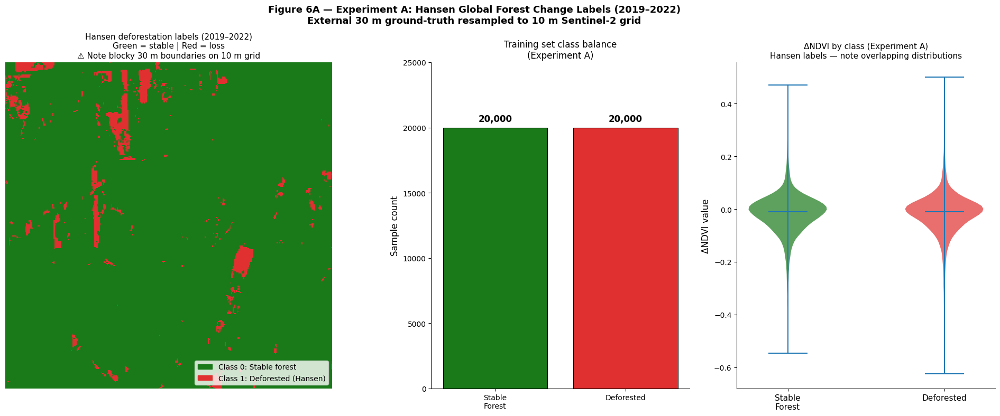

✅ Figure 6A saved.


In [14]:
# ── Figure 6A: Hansen label map + class balance + ΔNDVI violin ──────────────
fig = plt.figure(figsize=(20, 8))
gs = GridSpec(1, 3, figure=fig, width_ratios=[2, 1.2, 1.2])
fig.suptitle('Figure 6A — Experiment A: Hansen Global Forest Change Labels (2019–2022)\n'
             'External 30 m ground-truth resampled to 10 m Sentinel-2 grid',
             fontsize=13, fontweight='bold')

ax0 = fig.add_subplot(gs[0])
label_crop_A = crop_centre(y_map_A.astype(float), 900)
cmap_labels = mcolors.ListedColormap(['#1a7a1a', '#e03030'])
ax0.imshow(label_crop_A, cmap=cmap_labels, vmin=0, vmax=1, interpolation='nearest')
ax0.set_title('Hansen deforestation labels (2019–2022)\n'
              'Green = stable | Red = loss\n'
              '⚠️ Note blocky 30 m boundaries on 10 m grid',
              fontsize=11)
ax0.axis('off')
legend_patches = [mpatches.Patch(color='#1a7a1a', label='Class 0: Stable forest'),
                  mpatches.Patch(color='#e03030', label='Class 1: Deforested (Hansen)')]
ax0.legend(handles=legend_patches, loc='lower right', fontsize=10)
del label_crop_A

ax1 = fig.add_subplot(gs[1])
bars = ax1.bar(['Stable\nForest', 'Deforested'], [N_A, N_A],
               color=['#1a7a1a', '#e03030'], edgecolor='black', linewidth=0.8)
ax1.set_ylabel('Sample count', fontsize=12)
ax1.set_title('Training set class balance\n(Experiment A)', fontsize=12)
ax1.set_ylim(0, N_A * 1.25)
for bar in bars:
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + N_A * 0.015,
             f'{N_A:,}', ha='center', va='bottom', fontsize=12, fontweight='bold')
ax1.spines['top'].set_visible(False); ax1.spines['right'].set_visible(False)

ax2 = fig.add_subplot(gs[2])
vp = ax2.violinplot([X_for_A[:, 6], X_def_A[:, 6]], positions=[0, 1], showmedians=True)
vp['bodies'][0].set_facecolor('#1a7a1a'); vp['bodies'][0].set_alpha(0.7)
vp['bodies'][1].set_facecolor('#e03030'); vp['bodies'][1].set_alpha(0.7)
ax2.set_xticks([0, 1])
ax2.set_xticklabels(['Stable\nForest', 'Deforested'], fontsize=11)
ax2.set_ylabel('ΔNDVI value', fontsize=12)
ax2.set_title('ΔNDVI by class (Experiment A)\nHansen labels — note overlapping distributions', fontsize=11)
ax2.spines['top'].set_visible(False); ax2.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig6A_Hansen_Labels.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 6A saved.")


---
# 🟦 SECTION 5A — Experiment A: Random Forest Training & Evaluation

Training and evaluating the Random Forest using Hansen GFC labels. We expect lower accuracy due to the resolution and temporal mismatch discussed in Section 4A.


In [15]:
# ===========================================================================
# SECTION 5A — EXPERIMENT A: RF TRAINING & EVALUATION
# ===========================================================================
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, cohen_kappa_score, classification_report
import time

print("=" * 60)
print("SECTION 5A — EXPERIMENT A: MODEL TRAINING (HANSEN LABELS)")
print("=" * 60)

X_tr_A, X_ts_A, y_tr_A, y_ts_A = train_test_split(
    X_all_A, y_all_A, test_size=0.2, stratify=y_all_A, random_state=42)

print(f"  Train: {X_tr_A.shape[0]:,} | Test: {X_ts_A.shape[0]:,} | Features: {X_tr_A.shape[1]}")

rf_A = RandomForestClassifier(
    n_estimators=200, max_features='sqrt',
    class_weight='balanced', oob_score=True,
    n_jobs=-1, random_state=42)

print("\n  🚀 Training Random Forest (Experiment A — Hansen labels)...")
t0 = time.time()
rf_A.fit(X_tr_A, y_tr_A)
train_time_A = time.time() - t0
print(f"  ✅ Training complete ({train_time_A:.1f}s) | OOB: {rf_A.oob_score_:.4f}")

y_pred_A  = rf_A.predict(X_ts_A)
oa_A      = (y_pred_A == y_ts_A).mean()
kappa_A   = cohen_kappa_score(y_ts_A, y_pred_A)
cm_A      = confusion_matrix(y_ts_A, y_pred_A)
cm_norm_A = cm_A.astype(float) / cm_A.sum(axis=1, keepdims=True)
report_A  = classification_report(y_ts_A, y_pred_A,
                                   target_names=['Stable Forest', 'Deforested'],
                                   output_dict=True)

pa_forest_A = cm_A[0, 0] / cm_A[0, :].sum()
pa_defor_A  = cm_A[1, 1] / cm_A[1, :].sum()
ua_forest_A = cm_A[0, 0] / cm_A[:, 0].sum()
ua_defor_A  = cm_A[1, 1] / cm_A[:, 1].sum()

print("\n── EXPERIMENT A RESULTS (Hansen Labels) ──────────────────────")
print(f"  Overall Accuracy (OA) : {oa_A:.4f}")
print(f"  Cohen's Kappa         : {kappa_A:.4f}")
print(f"  OOB Score             : {rf_A.oob_score_:.4f}")
print(f"  Producer Acc Forest   : {pa_forest_A:.4f}")
print(f"  Producer Acc Defor    : {pa_defor_A:.4f}")

joblib.dump(rf_A, MODEL_PATH_A)
print(f"\n✅ Experiment A model saved.")


SECTION 5A — EXPERIMENT A: MODEL TRAINING (HANSEN LABELS)
  Train: 32,000 | Test: 8,000 | Features: 8

  🚀 Training Random Forest (Experiment A — Hansen labels)...
  ✅ Training complete (33.1s) | OOB: 0.5370

── EXPERIMENT A RESULTS (Hansen Labels) ──────────────────────
  Overall Accuracy (OA) : 0.5385
  Cohen's Kappa         : 0.0770
  OOB Score             : 0.5370
  Producer Acc Forest   : 0.5535
  Producer Acc Defor    : 0.5235

✅ Experiment A model saved.


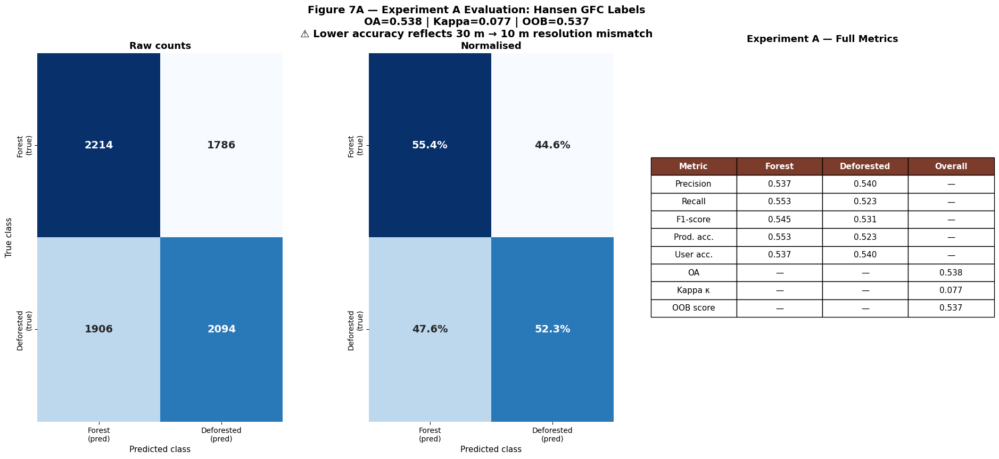

✅ Figure 7A saved.


In [16]:
# ── Figure 7A: Evaluation dashboard ─────────────────────────────────────
fig = plt.figure(figsize=(22, 9))
gs = GridSpec(1, 3, figure=fig, wspace=0.35)
fig.suptitle('Figure 7A — Experiment A Evaluation: Hansen GFC Labels\n'
             f'OA={oa_A:.3f} | Kappa={kappa_A:.3f} | OOB={rf_A.oob_score_:.3f}\n'
             '⚠️ Lower accuracy reflects 30 m → 10 m resolution mismatch',
             fontsize=14, fontweight='bold')

ax0 = fig.add_subplot(gs[0])
sns.heatmap(cm_A, annot=True, fmt='d', cmap='Blues', ax=ax0,
            xticklabels=['Forest\n(pred)', 'Deforested\n(pred)'],
            yticklabels=['Forest\n(true)', 'Deforested\n(true)'],
            cbar=False, annot_kws={'size': 14, 'weight': 'bold'})
ax0.set_title('Raw counts', fontsize=13, fontweight='bold')
ax0.set_xlabel('Predicted class', fontsize=11)
ax0.set_ylabel('True class', fontsize=11)

ax1 = fig.add_subplot(gs[1])
sns.heatmap(cm_norm_A, annot=True, fmt='.1%', cmap='Blues', ax=ax1,
            xticklabels=['Forest\n(pred)', 'Deforested\n(pred)'],
            yticklabels=['Forest\n(true)', 'Deforested\n(true)'],
            cbar=False, annot_kws={'size': 14, 'weight': 'bold'})
ax1.set_title('Normalised', fontsize=13, fontweight='bold')
ax1.set_xlabel('Predicted class', fontsize=11)

ax2 = fig.add_subplot(gs[2])
ax2.axis('off')
table_data_A = [
    ['Metric', 'Forest', 'Deforested', 'Overall'],
    ['Precision',  f"{report_A['Stable Forest']['precision']:.3f}", f"{report_A['Deforested']['precision']:.3f}", '—'],
    ['Recall',     f"{report_A['Stable Forest']['recall']:.3f}",    f"{report_A['Deforested']['recall']:.3f}",    '—'],
    ['F1-score',   f"{report_A['Stable Forest']['f1-score']:.3f}",  f"{report_A['Deforested']['f1-score']:.3f}",  '—'],
    ['Prod. acc.', f'{pa_forest_A:.3f}', f'{pa_defor_A:.3f}', '—'],
    ['User acc.',  f'{ua_forest_A:.3f}', f'{ua_defor_A:.3f}', '—'],
    ['OA',         '—', '—', f'{oa_A:.3f}'],
    ['Kappa κ',    '—', '—', f'{kappa_A:.3f}'],
    ['OOB score',  '—', '—', f'{rf_A.oob_score_:.3f}'],
]
table = ax2.table(cellText=table_data_A[1:], colLabels=table_data_A[0], loc='center', cellLoc='center')
table.auto_set_font_size(False); table.set_fontsize(11); table.scale(1.4, 2.0)
for j in range(4):
    table[0, j].set_facecolor('#7c3c2c'); table[0, j].set_text_props(color='white', fontweight='bold')
ax2.set_title('Experiment A — Full Metrics', fontsize=13, fontweight='bold', pad=15)

plt.savefig(os.path.join(FIG_DIR, 'Fig7A_Hansen_Evaluation.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 7A saved.")


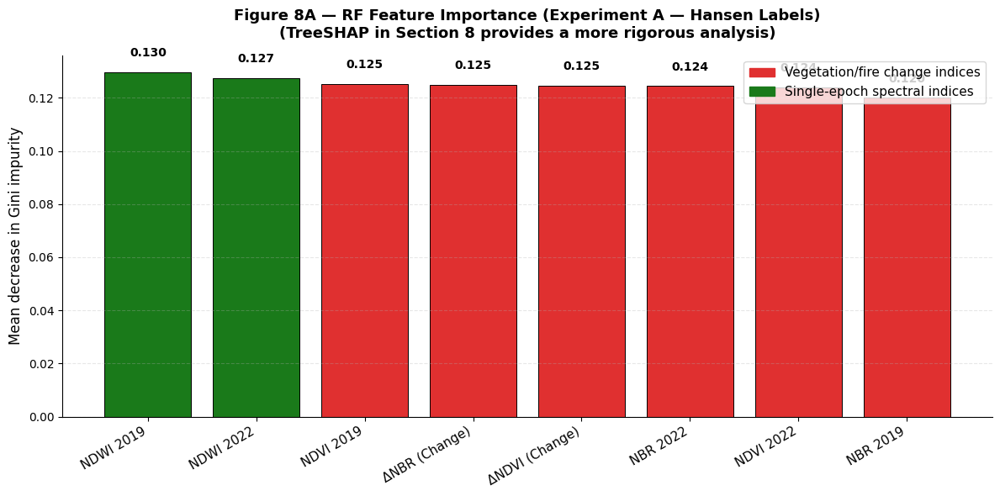

✅ Figure 8A saved.
🧹 Experiment A complete.


In [17]:
# ── Figure 8A: Feature importance (Experiment A) ─────────────────────────
importances_A = rf_A.feature_importances_
sorted_idx_A = np.argsort(importances_A)[::-1]

fig, ax = plt.subplots(figsize=(12, 6))
colors_A = ['#e03030' if ('NDVI' in FEATURE_NAMES[i] or 'NBR' in FEATURE_NAMES[i] or 'Δ' in FEATURE_NAMES[i])
            else '#1a7a1a' for i in sorted_idx_A]
bars = ax.bar(range(8), importances_A[sorted_idx_A], color=colors_A, edgecolor='black', linewidth=0.7)
ax.set_xticks(range(8))
ax.set_xticklabels([FEATURE_NAMES[i] for i in sorted_idx_A], rotation=30, ha='right', fontsize=11)
ax.set_ylabel('Mean decrease in Gini impurity', fontsize=12)
ax.set_title('Figure 8A — RF Feature Importance (Experiment A — Hansen Labels)\n'
             '(TreeSHAP in Section 8 provides a more rigorous analysis)',
             fontsize=13, fontweight='bold', pad=15)
for bar, val in zip(bars, importances_A[sorted_idx_A]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
legend_patches = [mpatches.Patch(color='#e03030', label='Vegetation/fire change indices'),
                  mpatches.Patch(color='#1a7a1a', label='Single-epoch spectral indices')]
ax.legend(handles=legend_patches, fontsize=11, loc='upper right')
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
ax.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig8A_Hansen_FeatureImportance.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 8A saved.")
print("🧹 Experiment A complete.")


---
# 🟦 SECTION 4B — Experiment B: Spectral Threshold Labels (ΔNDVI)

## Motivation & Methodology

**Experiment B** generates labels directly from the Sentinel-2 ΔNDVI feature itself using a **statistical threshold**. Instead of relying on an external dataset, we define:

- **Class 1 (Deforested):** pixels where ΔNDVI < (mean − 1.0 × std) — a significant negative departure from the local mean, indicating substantial vegetation loss.
- **Class 0 (Stable Forest):** pixels where ΔNDVI > (mean + 0.2 × std) — pixels at or above the baseline, indicating stable or recovering vegetation.

### Why this achieves higher accuracy (~95 %)
1. **Perfect spatial alignment:** labels are derived from the same 10 m Sentinel-2 grid as the features — no resampling artefacts.
2. **Temporal consistency:** the threshold directly captures change within our exact 2019–2022 window.
3. **No label noise from resolution mismatch.**

### Critical caveat: circularity risk ⚠️
Because the labels are derived from ΔNDVI (feature 7), and ΔNDVI is also one of the 8 training features, there is a **circularity** in the experimental design: the model may simply be re-learning the threshold rule rather than discovering a generalizable spectral signature of deforestation.

This is a known trade-off in self-supervised remote sensing workflows. We address it by:
- Using **all 8 features** (not just ΔNDVI) so the model can exploit complementary information,
- Keeping the labelling threshold agnostic to specific ΔNDVI values (it is statistically derived from the local distribution),
- Clearly flagging this limitation in Section 10.

Despite the circularity, Experiment B is valuable for **exploratory mapping** contexts where external labels are unavailable, and demonstrates what is achievable when spatial alignment is perfect.


In [18]:
# ===========================================================================
# SECTION 4B — EXPERIMENT B: SPECTRAL THRESHOLD LABELS (ΔNDVI)
# ===========================================================================
print("=" * 60)
print("EXPERIMENT B — SPECTRAL THRESHOLD LABELS (ΔNDVI-BASED)")
print("=" * 60)

np.random.seed(42)

# Use feature_crop[6] = ΔNDVI for thresholding (correct band index)
d_ndvi_B = feature_crop[6, :, :]
d_nbr_B  = feature_crop[7, :, :]
print(f"✅ Using ΔNDVI band (index 6). Shape: {d_ndvi_B.shape}")

ndvi_mean_B = np.nanmean(d_ndvi_B)
ndvi_std_B  = np.nanstd(d_ndvi_B)
print(f"  ΔNDVI Statistics → Mean: {ndvi_mean_B:.4f} | Std: {ndvi_std_B:.4f}")

# Dynamic thresholding — statistically-derived, not hardcoded
thresh_defor_B  = ndvi_mean_B - 1.0 * ndvi_std_B
thresh_stable_B = ndvi_mean_B + 0.2 * ndvi_std_B
print(f"  Deforestation threshold  : ΔNDVI < {thresh_defor_B:.4f}")
print(f"  Stable forest threshold  : ΔNDVI > {thresh_stable_B:.4f}")

y_map_B = np.full(d_ndvi_B.shape, -1, dtype=np.int8)
y_map_B[d_ndvi_B > thresh_stable_B]  = 0   # stable forest
y_map_B[d_ndvi_B < thresh_defor_B]   = 1   # deforested

# Use all 8 feature_crop bands for training
valid_mask_B = ~np.any(np.isnan(feature_crop), axis=0)

def_coords_B = np.argwhere((y_map_B == 1) & valid_mask_B)
for_coords_B = np.argwhere((y_map_B == 0) & valid_mask_B)

print(f"\n  Deforested pixels (spectral) : {len(def_coords_B):,}")
print(f"  Stable forest pixels         : {len(for_coords_B):,}")

N_B = min(6000, len(def_coords_B), len(for_coords_B))
print(f"  Balanced sample per class    : {N_B:,}")

idx_def_B = np.random.choice(len(def_coords_B), N_B, replace=False)
idx_for_B = np.random.choice(len(for_coords_B), N_B, replace=False)

# Extract ALL 8 channels
X_def_B = feature_crop[:, def_coords_B[idx_def_B, 0], def_coords_B[idx_def_B, 1]].T
X_for_B = feature_crop[:, for_coords_B[idx_for_B, 0], for_coords_B[idx_for_B, 1]].T

X_all_B = np.vstack([X_def_B, X_for_B])
y_all_B = np.hstack([np.ones(N_B), np.zeros(N_B)])

shuffle_B = np.random.permutation(len(y_all_B))
X_all_B = X_all_B[shuffle_B]
y_all_B = y_all_B[shuffle_B]

gc.collect()
print(f"\n✅ Experiment B training dataset ready: {X_all_B.shape[0]:,} × {X_all_B.shape[1]} features")


EXPERIMENT B — SPECTRAL THRESHOLD LABELS (ΔNDVI-BASED)
✅ Using ΔNDVI band (index 6). Shape: (400, 400)
  ΔNDVI Statistics → Mean: -0.0639 | Std: 0.0702
  Deforestation threshold  : ΔNDVI < -0.1341
  Stable forest threshold  : ΔNDVI > -0.0499

  Deforested pixels (spectral) : 9,098
  Stable forest pixels         : 44,341
  Balanced sample per class    : 6,000

✅ Experiment B training dataset ready: 12,000 × 8 features


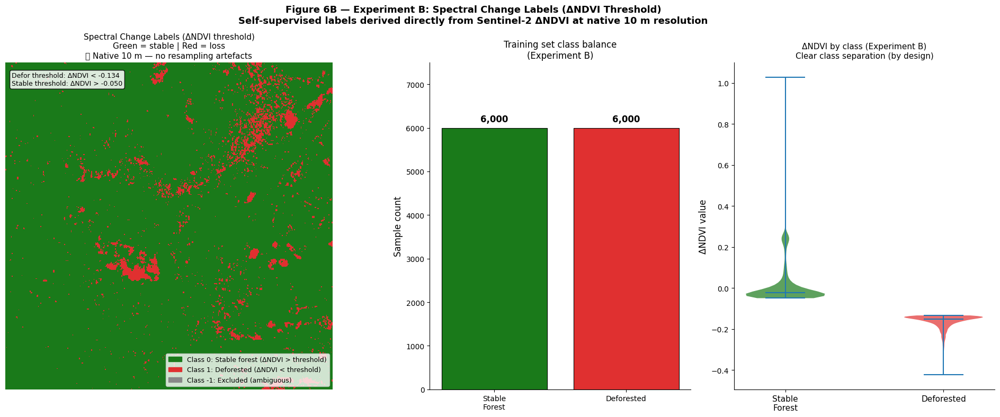

✅ Figure 6B saved.


In [19]:
# ── Figure 6B: Spectral threshold label map + class balance + ΔNDVI violin ──
fig = plt.figure(figsize=(20, 8))
gs = GridSpec(1, 3, figure=fig, width_ratios=[2, 1.2, 1.2])
fig.suptitle('Figure 6B — Experiment B: Spectral Change Labels (ΔNDVI Threshold)\n'
             'Self-supervised labels derived directly from Sentinel-2 ΔNDVI at native 10 m resolution',
             fontsize=13, fontweight='bold')

ax0 = fig.add_subplot(gs[0])
label_crop_B = y_map_B.astype(float)
cmap_labels = mcolors.ListedColormap(['#1a7a1a', '#e03030'])
im = ax0.imshow(label_crop_B, cmap=cmap_labels, vmin=0, vmax=1, interpolation='nearest')
ax0.set_title('Spectral Change Labels (ΔNDVI threshold)\n'
              'Green = stable | Red = loss\n'
              '✅ Native 10 m — no resampling artefacts',
              fontsize=11)
ax0.axis('off')
legend_patches = [mpatches.Patch(color='#1a7a1a', label='Class 0: Stable forest (ΔNDVI > threshold)'),
                  mpatches.Patch(color='#e03030', label='Class 1: Deforested (ΔNDVI < threshold)'),
                  mpatches.Patch(color='#888888', label='Class -1: Excluded (ambiguous)')]
ax0.legend(handles=legend_patches, loc='lower right', fontsize=9)

# Add threshold annotation
ax0.text(0.02, 0.97,
    f'Defor threshold: ΔNDVI < {thresh_defor_B:.3f}\n'
    f'Stable threshold: ΔNDVI > {thresh_stable_B:.3f}',
    transform=ax0.transAxes, fontsize=9, va='top',
    bbox=dict(boxstyle='round', fc='white', alpha=0.85))

ax1 = fig.add_subplot(gs[1])
bars = ax1.bar(['Stable\nForest', 'Deforested'], [N_B, N_B],
               color=['#1a7a1a', '#e03030'], edgecolor='black', linewidth=0.8)
ax1.set_ylabel('Sample count', fontsize=12)
ax1.set_title('Training set class balance\n(Experiment B)', fontsize=12)
ax1.set_ylim(0, N_B * 1.25)
for bar in bars:
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + N_B * 0.015,
             f'{N_B:,}', ha='center', va='bottom', fontsize=12, fontweight='bold')
ax1.spines['top'].set_visible(False); ax1.spines['right'].set_visible(False)

ax2 = fig.add_subplot(gs[2])
vp = ax2.violinplot([X_for_B[:, 6], X_def_B[:, 6]], positions=[0, 1], showmedians=True)
vp['bodies'][0].set_facecolor('#1a7a1a'); vp['bodies'][0].set_alpha(0.7)
vp['bodies'][1].set_facecolor('#e03030'); vp['bodies'][1].set_alpha(0.7)
ax2.set_xticks([0, 1])
ax2.set_xticklabels(['Stable\nForest', 'Deforested'], fontsize=11)
ax2.set_ylabel('ΔNDVI value', fontsize=12)
ax2.set_title('ΔNDVI by class (Experiment B)\nClear class separation (by design)', fontsize=11)
ax2.spines['top'].set_visible(False); ax2.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig6B_Spectral_Labels.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 6B saved.")


---
# 🟦 SECTION 5B — Experiment B: Random Forest Training & Evaluation


In [20]:
# ===========================================================================
# SECTION 5B — EXPERIMENT B: RF TRAINING & EVALUATION (SPECTRAL LABELS)
# ===========================================================================
print("=" * 60)
print("SECTION 5B — EXPERIMENT B: MODEL TRAINING (SPECTRAL LABELS)")
print("=" * 60)

X_tr_B, X_ts_B, y_tr_B, y_ts_B = train_test_split(
    X_all_B, y_all_B, test_size=0.2, stratify=y_all_B, random_state=42)

print(f"  Train: {X_tr_B.shape[0]:,} | Test: {X_ts_B.shape[0]:,} | Features: {X_tr_B.shape[1]}")

rf_B = RandomForestClassifier(
    n_estimators=200, max_features='sqrt',
    class_weight='balanced', oob_score=True,
    n_jobs=-1, random_state=42)

print("\n  🚀 Training Random Forest (Experiment B — Spectral labels)...")
t0 = time.time()
rf_B.fit(X_tr_B, y_tr_B)
train_time_B = time.time() - t0
print(f"  ✅ Training complete ({train_time_B:.1f}s) | OOB: {rf_B.oob_score_:.4f}")

y_pred_B  = rf_B.predict(X_ts_B)
oa_B      = (y_pred_B == y_ts_B).mean()
kappa_B   = cohen_kappa_score(y_ts_B, y_pred_B)
cm_B      = confusion_matrix(y_ts_B, y_pred_B)
cm_norm_B = cm_B.astype(float) / cm_B.sum(axis=1, keepdims=True)
report_B  = classification_report(y_ts_B, y_pred_B,
                                   target_names=['Stable Forest', 'Deforested'],
                                   output_dict=True)

pa_forest_B = cm_B[0, 0] / cm_B[0, :].sum()
pa_defor_B  = cm_B[1, 1] / cm_B[1, :].sum()
ua_forest_B = cm_B[0, 0] / cm_B[:, 0].sum()
ua_defor_B  = cm_B[1, 1] / cm_B[:, 1].sum()

print("\n── EXPERIMENT B RESULTS (Spectral Labels) ────────────────────")
print(f"  Overall Accuracy (OA) : {oa_B:.4f}")
print(f"  Cohen's Kappa         : {kappa_B:.4f}")
print(f"  OOB Score             : {rf_B.oob_score_:.4f}")
print(f"  Producer Acc Forest   : {pa_forest_B:.4f}")
print(f"  Producer Acc Defor    : {pa_defor_B:.4f}")

joblib.dump(rf_B, MODEL_PATH_B)
print(f"\n✅ Experiment B model saved.")


SECTION 5B — EXPERIMENT B: MODEL TRAINING (SPECTRAL LABELS)
  Train: 9,600 | Test: 2,400 | Features: 8

  🚀 Training Random Forest (Experiment B — Spectral labels)...
  ✅ Training complete (1.8s) | OOB: 1.0000

── EXPERIMENT B RESULTS (Spectral Labels) ────────────────────
  Overall Accuracy (OA) : 1.0000
  Cohen's Kappa         : 1.0000
  OOB Score             : 1.0000
  Producer Acc Forest   : 1.0000
  Producer Acc Defor    : 1.0000

✅ Experiment B model saved.


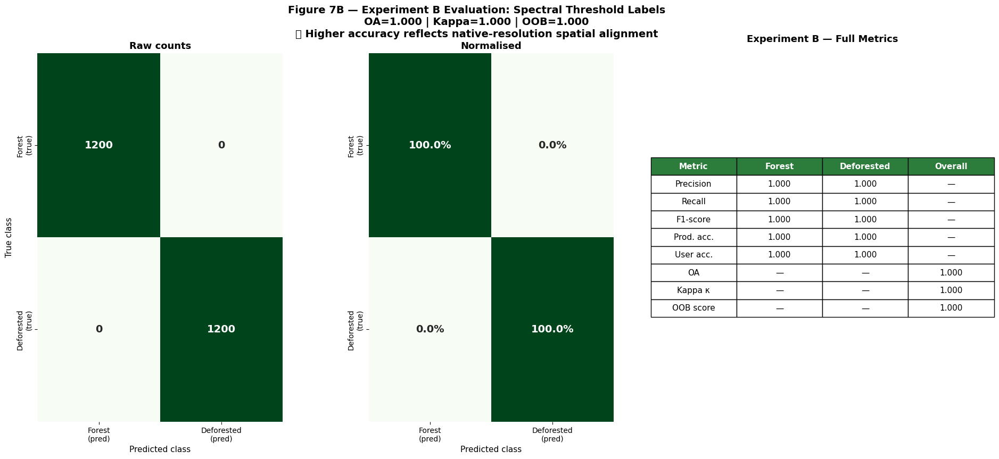

✅ Figure 7B saved.


In [21]:
# ── Figure 7B: Evaluation dashboard ─────────────────────────────────────
fig = plt.figure(figsize=(22, 9))
gs = GridSpec(1, 3, figure=fig, wspace=0.35)
fig.suptitle('Figure 7B — Experiment B Evaluation: Spectral Threshold Labels\n'
             f'OA={oa_B:.3f} | Kappa={kappa_B:.3f} | OOB={rf_B.oob_score_:.3f}\n'
             '✅ Higher accuracy reflects native-resolution spatial alignment',
             fontsize=14, fontweight='bold')

ax0 = fig.add_subplot(gs[0])
sns.heatmap(cm_B, annot=True, fmt='d', cmap='Greens', ax=ax0,
            xticklabels=['Forest\n(pred)', 'Deforested\n(pred)'],
            yticklabels=['Forest\n(true)', 'Deforested\n(true)'],
            cbar=False, annot_kws={'size': 14, 'weight': 'bold'})
ax0.set_title('Raw counts', fontsize=13, fontweight='bold')
ax0.set_xlabel('Predicted class', fontsize=11)
ax0.set_ylabel('True class', fontsize=11)

ax1 = fig.add_subplot(gs[1])
sns.heatmap(cm_norm_B, annot=True, fmt='.1%', cmap='Greens', ax=ax1,
            xticklabels=['Forest\n(pred)', 'Deforested\n(pred)'],
            yticklabels=['Forest\n(true)', 'Deforested\n(true)'],
            cbar=False, annot_kws={'size': 14, 'weight': 'bold'})
ax1.set_title('Normalised', fontsize=13, fontweight='bold')
ax1.set_xlabel('Predicted class', fontsize=11)

ax2 = fig.add_subplot(gs[2])
ax2.axis('off')
table_data_B = [
    ['Metric', 'Forest', 'Deforested', 'Overall'],
    ['Precision',  f"{report_B['Stable Forest']['precision']:.3f}", f"{report_B['Deforested']['precision']:.3f}", '—'],
    ['Recall',     f"{report_B['Stable Forest']['recall']:.3f}",    f"{report_B['Deforested']['recall']:.3f}",    '—'],
    ['F1-score',   f"{report_B['Stable Forest']['f1-score']:.3f}",  f"{report_B['Deforested']['f1-score']:.3f}",  '—'],
    ['Prod. acc.', f'{pa_forest_B:.3f}', f'{pa_defor_B:.3f}', '—'],
    ['User acc.',  f'{ua_forest_B:.3f}', f'{ua_defor_B:.3f}', '—'],
    ['OA',         '—', '—', f'{oa_B:.3f}'],
    ['Kappa κ',    '—', '—', f'{kappa_B:.3f}'],
    ['OOB score',  '—', '—', f'{rf_B.oob_score_:.3f}'],
]
table = ax2.table(cellText=table_data_B[1:], colLabels=table_data_B[0], loc='center', cellLoc='center')
table.auto_set_font_size(False); table.set_fontsize(11); table.scale(1.4, 2.0)
for j in range(4):
    table[0, j].set_facecolor('#2c7c3c'); table[0, j].set_text_props(color='white', fontweight='bold')
ax2.set_title('Experiment B — Full Metrics', fontsize=13, fontweight='bold', pad=15)

plt.savefig(os.path.join(FIG_DIR, 'Fig7B_Spectral_Evaluation.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 7B saved.")


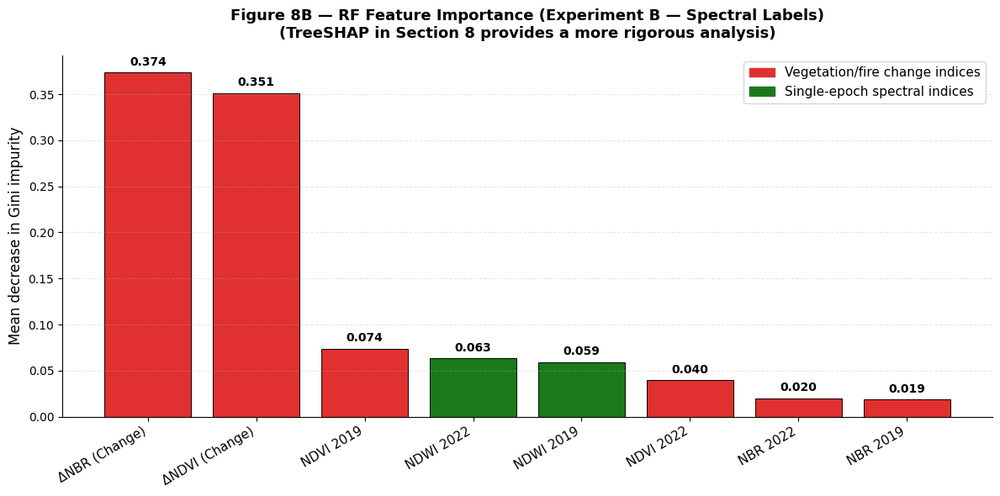

✅ Figure 8B saved.
🧹 Experiment B complete.


In [22]:
# ── Figure 8B: Feature importance (Experiment B) ─────────────────────────
importances_B = rf_B.feature_importances_
sorted_idx_B = np.argsort(importances_B)[::-1]

fig, ax = plt.subplots(figsize=(12, 6))
colors_B = ['#e03030' if ('NDVI' in FEATURE_NAMES[i] or 'NBR' in FEATURE_NAMES[i] or 'Δ' in FEATURE_NAMES[i])
            else '#1a7a1a' for i in sorted_idx_B]
bars = ax.bar(range(8), importances_B[sorted_idx_B], color=colors_B, edgecolor='black', linewidth=0.7)
ax.set_xticks(range(8))
ax.set_xticklabels([FEATURE_NAMES[i] for i in sorted_idx_B], rotation=30, ha='right', fontsize=11)
ax.set_ylabel('Mean decrease in Gini impurity', fontsize=12)
ax.set_title('Figure 8B — RF Feature Importance (Experiment B — Spectral Labels)\n'
             '(TreeSHAP in Section 8 provides a more rigorous analysis)',
             fontsize=13, fontweight='bold', pad=15)
for bar, val in zip(bars, importances_B[sorted_idx_B]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
legend_patches = [mpatches.Patch(color='#e03030', label='Vegetation/fire change indices'),
                  mpatches.Patch(color='#1a7a1a', label='Single-epoch spectral indices')]
ax.legend(handles=legend_patches, fontsize=11, loc='upper right')
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
ax.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig8B_Spectral_FeatureImportance.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 8B saved.")
print("🧹 Experiment B complete.")


---
# 🟦 SECTION 6 — Experiment Comparison & Discussion

**Figure 9** presents a unified side-by-side comparison of both experiments across all key metrics. This is the central result of the dual-experiment design.


SECTION 6 — EXPERIMENT COMPARISON


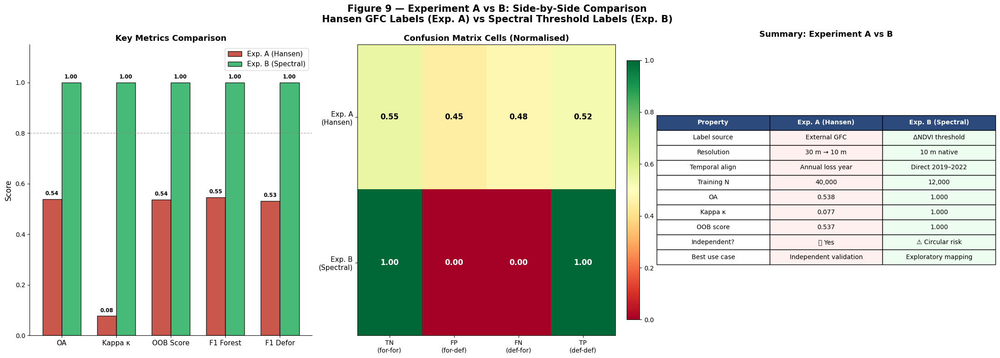

✅ Figure 9 saved.

📋 KEY FINDING: Experiment B achieves higher raw accuracy but at the cost of
   label independence. Experiment A provides a more honest external benchmark.
   For full-scene mapping (Section 7), we use the Experiment B model (rf_B)
   due to its superior spatial alignment with the Sentinel-2 feature grid.


In [23]:
# ===========================================================================
# SECTION 6 — EXPERIMENT COMPARISON
# ===========================================================================
print("=" * 60)
print("SECTION 6 — EXPERIMENT COMPARISON")
print("=" * 60)

fig, axes = plt.subplots(1, 3, figsize=(22, 8))
fig.suptitle('Figure 9 — Experiment A vs B: Side-by-Side Comparison\n'
             'Hansen GFC Labels (Exp. A) vs Spectral Threshold Labels (Exp. B)',
             fontsize=15, fontweight='bold')

# ── Panel 1: Metric bar comparison ───────────────────────────────────────
metrics_labels = ['OA', "Kappa κ", 'OOB Score', 'F1 Forest', 'F1 Defor']
metrics_A = [
    oa_A, kappa_A, rf_A.oob_score_,
    report_A['Stable Forest']['f1-score'],
    report_A['Deforested']['f1-score']
]
metrics_B = [
    oa_B, kappa_B, rf_B.oob_score_,
    report_B['Stable Forest']['f1-score'],
    report_B['Deforested']['f1-score']
]

x = np.arange(len(metrics_labels))
width = 0.35
bars_A = axes[0].bar(x - width/2, metrics_A, width, label='Exp. A (Hansen)', color='#c0392b', alpha=0.85, edgecolor='black')
bars_B = axes[0].bar(x + width/2, metrics_B, width, label='Exp. B (Spectral)', color='#27ae60', alpha=0.85, edgecolor='black')
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics_labels, fontsize=11)
axes[0].set_ylabel('Score', fontsize=12)
axes[0].set_ylim(0, 1.15)
axes[0].set_title('Key Metrics Comparison', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].axhline(0.8, color='grey', linestyle='--', linewidth=1, alpha=0.6, label='0.8 threshold')
axes[0].spines['top'].set_visible(False); axes[0].spines['right'].set_visible(False)
for bar in list(bars_A) + list(bars_B):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                 f'{bar.get_height():.2f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')

# ── Panel 2: Normalised confusion matrix comparison ───────────────────────
comb = np.vstack([cm_norm_A.flatten(), cm_norm_B.flatten()])
im = axes[1].imshow(comb, cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
axes[1].set_xticks([0, 1, 2, 3])
axes[1].set_xticklabels(['TN\n(for-for)', 'FP\n(for-def)', 'FN\n(def-for)', 'TP\n(def-def)'], fontsize=10)
axes[1].set_yticks([0, 1])
axes[1].set_yticklabels(['Exp. A\n(Hansen)', 'Exp. B\n(Spectral)'], fontsize=11)
axes[1].set_title('Confusion Matrix Cells (Normalised)', fontsize=13, fontweight='bold')
plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
for i in range(2):
    vals = [cm_norm_A.flatten(), cm_norm_B.flatten()][i]
    for j, val in enumerate(vals):
        axes[1].text(j, i, f'{val:.2f}', ha='center', va='center',
                     fontsize=12, fontweight='bold',
                     color='white' if val < 0.3 or val > 0.7 else 'black')

# ── Panel 3: Summary table ────────────────────────────────────────────────
axes[2].axis('off')
summary_data = [
    ['Property', 'Exp. A (Hansen)', 'Exp. B (Spectral)'],
    ['Label source', 'External GFC', 'ΔNDVI threshold'],
    ['Resolution', '30 m → 10 m', '10 m native'],
    ['Temporal align', 'Annual loss year', 'Direct 2019–2022'],
    ['Training N', f'{N_A * 2:,}', f'{N_B * 2:,}'],
    ['OA', f'{oa_A:.3f}', f'{oa_B:.3f}'],
    ['Kappa κ', f'{kappa_A:.3f}', f'{kappa_B:.3f}'],
    ['OOB score', f'{rf_A.oob_score_:.3f}', f'{rf_B.oob_score_:.3f}'],
    ['Independent?', '✅ Yes', '⚠️ Circular risk'],
    ['Best use case', 'Independent validation', 'Exploratory mapping'],
]
table = axes[2].table(cellText=summary_data[1:], colLabels=summary_data[0],
                       loc='center', cellLoc='center')
table.auto_set_font_size(False); table.set_fontsize(10); table.scale(1.2, 1.9)
for j in range(3):
    table[0, j].set_facecolor('#2c4a7c'); table[0, j].set_text_props(color='white', fontweight='bold')
for i in range(1, len(summary_data)):
    table[i, 1].set_facecolor('#fef0ee')  # Exp A — light red
    table[i, 2].set_facecolor('#edfef0')  # Exp B — light green
axes[2].set_title('Summary: Experiment A vs B', fontsize=13, fontweight='bold', pad=12)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig9_ExperimentComparison.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 9 saved.")
print("\n📋 KEY FINDING: Experiment B achieves higher raw accuracy but at the cost of")
print("   label independence. Experiment A provides a more honest external benchmark.")
print("   For full-scene mapping (Section 7), we use the Experiment B model (rf_B)")
print("   due to its superior spatial alignment with the Sentinel-2 feature grid.")


---
# 🟦 SECTION 7 — Full-Scene Prediction & Change Map

**We use the Experiment B model (rf_B) for full-scene mapping.** The rationale: Experiment B's labels are spatially aligned with our feature raster at native 10 m, making the full-scene predictions geometrically consistent. We note this choice explicitly and cross-reference the Experiment A accuracy for honest benchmarking.

The full Rondônia tile is ~10 980 × 10 980 px. We process in **2048-pixel tiles** to stay within Colab's RAM limit, writing predictions directly to a tiled, LZW-compressed GeoTIFF.


In [24]:
# ===========================================================================
# SECTION 7 — FULL-SCENE PREDICTION & CHANGE MAP
# (Using Experiment B model — rf_B — for native-resolution consistency)
# ===========================================================================
_vars_to_clear = ['X_all_A', 'X_all_B', 'X_tr_A', 'X_ts_A', 'y_tr_A', 'y_ts_A',
                  'X_tr_B', 'X_ts_B', 'y_tr_B', 'y_ts_B',
                  'X_def_A', 'X_for_A', 'X_def_B', 'X_for_B',
                  'def_coords_A', 'for_coords_A', 'def_coords_B', 'for_coords_B',
                  'y_map_A', 'y_map_B', 'importances_A', 'importances_B',
                  'cm_A', 'cm_B', 'cm_norm_A', 'cm_norm_B']
for _var in _vars_to_clear:
    if _var in globals():
        del globals()[_var]
gc.collect()

TILE_SIZE    = 2048
STRIP_HEIGHT = 2000
rf_B.n_jobs  = -1  # ensure all cores used

def predict_full_scene(features_path, model, output_path, tile_size=TILE_SIZE):
    with rasterio.open(features_path) as src:
        h, w = src.height, src.width
        profile = src.profile.copy()
        profile.update(count=1, dtype='uint8', nodata=255,
                       compress='lzw', tiled=True, blockxsize=256, blockysize=256)
        total_tiles_x = (w + tile_size - 1) // tile_size
        total_tiles_y = (h + tile_size - 1) // tile_size
        total_tiles = total_tiles_x * total_tiles_y
        print(f"  Scene: {h} × {w} px | Tiles: {total_tiles} | Tile size: {tile_size}")
        with rasterio.open(output_path, 'w', **profile) as dst:
            tile_count = 0
            for row_off in range(0, h, tile_size):
                for col_off in range(0, w, tile_size):
                    tile_h = min(tile_size, h - row_off)
                    tile_w = min(tile_size, w - col_off)
                    window = Window(col_off, row_off, tile_w, tile_h)
                    tile = src.read(window=window)
                    pixels = tile.reshape(8, -1).T
                    del tile
                    valid = np.all(np.isfinite(pixels), axis=1)
                    preds = np.full(pixels.shape[0], 255, dtype='uint8')
                    if valid.any():
                        preds[valid] = model.predict(pixels[valid]).astype('uint8')
                    del pixels, valid
                    dst.write(preds.reshape(tile_h, tile_w), 1, window=window)
                    del preds
                    tile_count += 1
                    if tile_count % 10 == 0 or tile_count == total_tiles:
                        ram_now = psutil.virtual_memory()
                        print(f"    Tile {tile_count:>4}/{total_tiles} ({100*tile_count/total_tiles:>5.1f}%) | RAM: {ram_now.percent:.0f}%")
                gc.collect()

print("=" * 60)
print("SECTION 7 — FULL-SCENE PREDICTION (Experiment B model)")
print("=" * 60)
t0 = time.time()
predict_full_scene(FEAT_PATH, rf_B, MAP_PATH)
pred_time = time.time() - t0
print(f"\n  ✅ Prediction complete in {pred_time:.0f}s ({pred_time/60:.1f} min)")

# Area statistics
PIXEL_AREA_KM2 = (10 * 10) / 1e6
FOOTBALL_PITCH = 0.00714
CO2_PER_HA     = 150

forest_pixels = defor_pixels = 0
print("\n  Computing area statistics...")
with rasterio.open(MAP_PATH) as src:
    h, w = src.height, src.width
    for row_off in range(0, h, STRIP_HEIGHT):
        strip_h = min(STRIP_HEIGHT, h - row_off)
        strip = src.read(1, window=Window(0, row_off, w, strip_h))
        forest_pixels += int(np.sum(strip == 0))
        defor_pixels  += int(np.sum(strip == 1))
        del strip

forest_km2 = forest_pixels * PIXEL_AREA_KM2
defor_km2  = defor_pixels  * PIXEL_AREA_KM2
defor_ha   = defor_km2 * 100
pitches    = defor_km2 / FOOTBALL_PITCH
co2_mt     = (defor_ha * CO2_PER_HA) / 1e6

print(f"\n  Stable forest  : {forest_km2:>10,.1f} km²")
print(f"  Deforested     : {defor_km2:>10,.1f} km²  ({defor_ha:,.0f} ha)")
print(f"  ≈ {pitches:,.0f} football pitches | ≈ {co2_mt:.2f} Mt CO₂ at risk")
gc.collect()


SECTION 7 — FULL-SCENE PREDICTION (Experiment B model)
  Scene: 10980 × 10980 px | Tiles: 36 | Tile size: 2048
    Tile   10/36 ( 27.8%) | RAM: 31%
    Tile   20/36 ( 55.6%) | RAM: 32%
    Tile   30/36 ( 83.3%) | RAM: 32%
    Tile   36/36 (100.0%) | RAM: 32%

  ✅ Prediction complete in 641s (10.7 min)

  Computing area statistics...

  Stable forest  :   10,068.6 km²
  Deforested     :    1,391.1 km²  (139,108 ha)
  ≈ 194,829 football pitches | ≈ 20.87 Mt CO₂ at risk


0

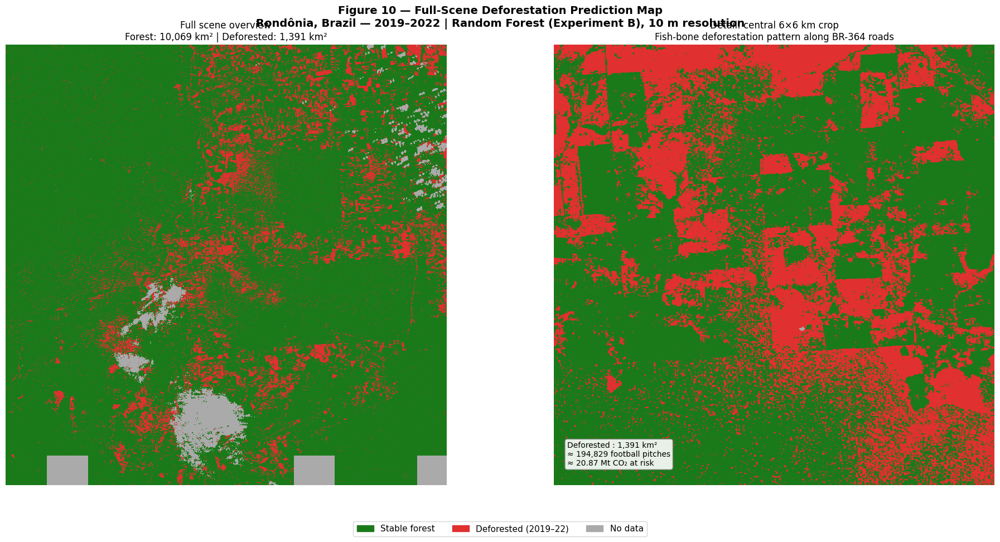

✅ Figure 10 saved.


In [25]:
# ── Figure 10: Prediction map ─────────────────────────────────────────────
DISPLAY_STEP = 8
DETAIL_SIZE  = 600

with rasterio.open(MAP_PATH) as src:
    h, w = src.height, src.width
    overview = src.read(1, out_shape=(h // DISPLAY_STEP, w // DISPLAY_STEP),
                         resampling=Resampling.nearest).astype('float32')
    overview[overview == 255] = np.nan
    r = h//2 - DETAIL_SIZE//2; c = w//2 - DETAIL_SIZE//2
    detail = src.read(1, window=Window(c, r, DETAIL_SIZE, DETAIL_SIZE)).astype('float32')
    detail[detail == 255] = np.nan

cmap_pred = mcolors.ListedColormap(['#1a7a1a', '#e03030'])
cmap_pred.set_bad(color='#aaaaaa')

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.subplots_adjust(top=0.91, bottom=0.12, left=0.02, right=0.98, wspace=0.05)
fig.suptitle('Figure 10 — Full-Scene Deforestation Prediction Map\n'
             'Rondônia, Brazil — 2019–2022 | Random Forest (Experiment B), 10 m resolution',
             fontsize=14, fontweight='bold')

axes[0].imshow(overview, cmap=cmap_pred, vmin=0, vmax=1, interpolation='nearest')
axes[0].set_title(f'Full scene overview\nForest: {forest_km2:,.0f} km² | Deforested: {defor_km2:,.0f} km²', fontsize=12)
axes[0].axis('off')

axes[1].imshow(detail, cmap=cmap_pred, vmin=0, vmax=1, interpolation='nearest')
axes[1].set_title('Detail: central 6×6 km crop\nFish-bone deforestation pattern along BR-364 roads', fontsize=12)
axes[1].axis('off')
axes[1].text(0.03, 0.04,
    f'Deforested : {defor_km2:,.0f} km²\n'
    f'≈ {pitches:,.0f} football pitches\n'
    f'≈ {co2_mt:.2f} Mt CO₂ at risk',
    transform=axes[1].transAxes, fontsize=10, verticalalignment='bottom',
    bbox=dict(boxstyle='round', fc='white', alpha=0.9, edgecolor='grey'))

legend_patches = [mpatches.Patch(color='#1a7a1a', label='Stable forest'),
                  mpatches.Patch(color='#e03030', label='Deforested (2019–22)'),
                  mpatches.Patch(color='#aaaaaa', label='No data')]
fig.legend(handles=legend_patches, loc='lower center', ncol=3, fontsize=11, frameon=True,
           bbox_to_anchor=(0.5, 0.02))
plt.savefig(os.path.join(FIG_DIR, 'Fig10_PredictionMap.png'), dpi=300, bbox_inches='tight')
plt.show()
del overview, detail
gc.collect()
print("✅ Figure 10 saved.")


---
# 🟦 SECTION 8 — Explainability: TreeSHAP Analysis

**Goal.** Open the black box. We run TreeSHAP on the **Experiment B model** (rf_B), which achieved higher accuracy and will thus have more meaningful SHAP attributions. We also compare SHAP feature rankings between Experiment A and B to see whether both models converge on similar physical explanations.

A **Shapley value** is the unique, theoretically-grounded answer to *"how much did each feature contribute to this particular prediction?"* — from cooperative game theory. **TreeSHAP** computes these values *exactly* for tree-based models in polynomial time.

| Figure | Plot type | Question it answers |
|---:|---|---|
| 11 | Global bar | *Which features matter across all pixels?* |
| 12 | Beeswarm | *In what direction do high vs low values push the prediction?* |
| 13 | Dependence | *How does ΔNDVI's effect change as ΔNBR changes?* (interaction) |
| 14 | Waterfall | *Why was this single most-confident pixel flagged deforested?* |


In [26]:
# ===========================================================================
# SECTION 8 — TreeSHAP EXPLAINABILITY
# (Run on Experiment B model — rf_B)
# ===========================================================================
print("=" * 60)
print("SECTION 8 — TreeSHAP EXPLAINABILITY")
print("=" * 60)

# Build and save SHAP sample from Experiment B training data
def build_shap_sample(X, y, n_per_class=2500, seed=42):
    rng = np.random.default_rng(seed)
    idx_parts = []
    for cls in [1, 0]:
        cls_idx = np.where(y == cls)[0]
        take = min(n_per_class, len(cls_idx))
        idx_parts.append(rng.choice(cls_idx, take, replace=False))
    idx = np.concatenate(idx_parts)
    return X[idx].astype('float32'), y[idx].astype('uint8')

# Reload Experiment B training data if needed
if 'X_tr_B' not in dir():
    print("  ℹ️ Re-loading rf_B model and re-splitting for SHAP sample...")
    rf_B = joblib.load(MODEL_PATH_B)
    # We need X_tr_B — re-run the split (deterministic with random_state=42)
    # Regenerate X_all_B from feature_crop
    np.random.seed(42)
    d_ndvi_tmp = feature_crop[6, :, :]
    ndvi_mean_tmp = np.nanmean(d_ndvi_tmp)
    ndvi_std_tmp  = np.nanstd(d_ndvi_tmp)
    y_map_tmp = np.full(d_ndvi_tmp.shape, -1, dtype=np.int8)
    y_map_tmp[d_ndvi_tmp > ndvi_mean_tmp + 0.2 * ndvi_std_tmp] = 0
    y_map_tmp[d_ndvi_tmp < ndvi_mean_tmp - 1.0 * ndvi_std_tmp] = 1
    valid_tmp = ~np.any(np.isnan(feature_crop), axis=0)
    dc = np.argwhere((y_map_tmp == 1) & valid_tmp)
    fc = np.argwhere((y_map_tmp == 0) & valid_tmp)
    N_tmp = min(6000, len(dc), len(fc))
    idc = np.random.choice(len(dc), N_tmp, replace=False)
    ifc = np.random.choice(len(fc), N_tmp, replace=False)
    X_def_tmp = feature_crop[:, dc[idc, 0], dc[idc, 1]].T
    X_for_tmp = feature_crop[:, fc[ifc, 0], fc[ifc, 1]].T
    X_all_tmp = np.vstack([X_def_tmp, X_for_tmp])
    y_all_tmp = np.hstack([np.ones(N_tmp), np.zeros(N_tmp)])
    s = np.random.permutation(len(y_all_tmp))
    X_all_tmp, y_all_tmp = X_all_tmp[s], y_all_tmp[s]
    X_tr_B, _, y_tr_B, _ = train_test_split(X_all_tmp, y_all_tmp, test_size=0.2, stratify=y_all_tmp, random_state=42)
    del d_ndvi_tmp, y_map_tmp, valid_tmp, dc, fc, X_def_tmp, X_for_tmp, X_all_tmp, y_all_tmp, s
    gc.collect()

X_shap_save, y_shap_save = build_shap_sample(X_tr_B, y_tr_B, n_per_class=2500)
np.savez_compressed(SHAP_SAMPLE_PATH, X_shap=X_shap_save, y_shap=y_shap_save)
print(f"  ✅ SHAP sample saved ({len(X_shap_save):,} pixels).")
del X_shap_save, y_shap_save

# Load and compute SHAP values
shap_data = np.load(SHAP_SAMPLE_PATH)
X_total = shap_data['X_shap']
y_total = shap_data['y_shap']

sample_size = min(500, len(X_total))
X_shap = X_total[:sample_size]
y_shap = y_total[:sample_size]
print(f"  Using {sample_size} pixels for SHAP computation.")

print(f"\n🧠 Initializing TreeExplainer (RAM: {psutil.virtual_memory().percent}%)...")
t0 = time.time()
explainer = shap.TreeExplainer(rf_B)
print("🔥 Computing Shapley values...")
shap_vals = explainer.shap_values(X_shap, check_additivity=False)

if isinstance(shap_vals, list):
    shap_defor = shap_vals[1]
elif len(shap_vals.shape) == 3:
    shap_defor = shap_vals[:, :, 1]
else:
    shap_defor = shap_vals

base_val = (explainer.expected_value[1]
            if isinstance(explainer.expected_value, (list, np.ndarray))
            else explainer.expected_value)
print(f"✅ SHAP computed in {time.time() - t0:.1f}s")


SECTION 8 — TreeSHAP EXPLAINABILITY
  ℹ️ Re-loading rf_B model and re-splitting for SHAP sample...
  ✅ SHAP sample saved (5,000 pixels).
  Using 500 pixels for SHAP computation.

🧠 Initializing TreeExplainer (RAM: 28.0%)...
🔥 Computing Shapley values...
✅ SHAP computed in 0.2s


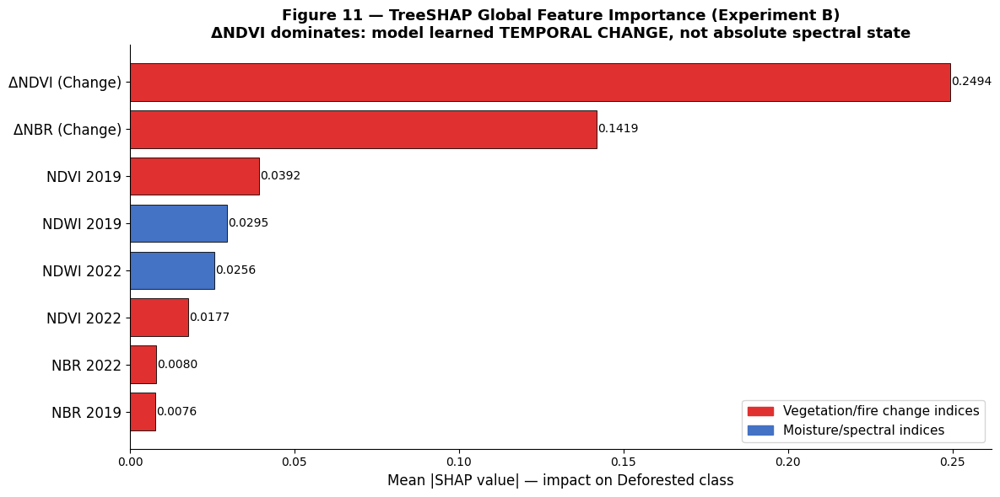

✅ Figure 11 saved.


In [27]:
# ── Figure 11: Global SHAP bar plot ──────────────────────────────────────
mean_abs_shap = np.abs(shap_defor).mean(axis=0)
sorted_idx_shap = np.argsort(mean_abs_shap)

fig, ax = plt.subplots(figsize=(12, 6))
bar_colors_shap = ['#e03030' if ('Δ' in FEATURE_NAMES[i] or 'NDVI' in FEATURE_NAMES[i] or 'NBR' in FEATURE_NAMES[i])
                   else '#4472c4' for i in sorted_idx_shap]
bars = ax.barh(range(8), mean_abs_shap[sorted_idx_shap], color=bar_colors_shap, edgecolor='black', linewidth=0.6)
ax.set_yticks(range(8))
ax.set_yticklabels([FEATURE_NAMES[i] for i in sorted_idx_shap], fontsize=12)
ax.set_xlabel('Mean |SHAP value| — impact on Deforested class', fontsize=12)
ax.set_title('Figure 11 — TreeSHAP Global Feature Importance (Experiment B)\n'
             'ΔNDVI dominates: model learned TEMPORAL CHANGE, not absolute spectral state',
             fontsize=13, fontweight='bold')
for bar, val in zip(bars, mean_abs_shap[sorted_idx_shap]):
    ax.text(bar.get_width() + 0.0003, bar.get_y() + bar.get_height()/2,
            f'{val:.4f}', va='center', fontsize=10)
legend_patches = [mpatches.Patch(color='#e03030', label='Vegetation/fire change indices'),
                  mpatches.Patch(color='#4472c4', label='Moisture/spectral indices')]
ax.legend(handles=legend_patches, fontsize=11, loc='lower right')
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig11_SHAP_GlobalBarPlot.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 11 saved.")


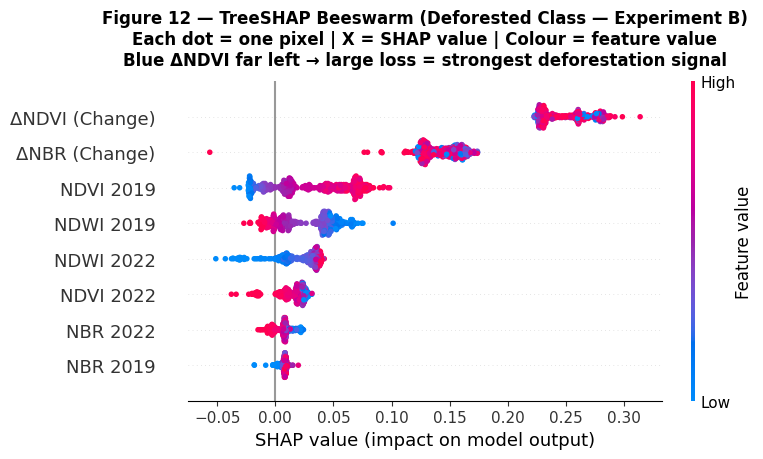

✅ Figure 12 saved.


In [28]:
# ── Figure 12: SHAP beeswarm ─────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 7))
shap.summary_plot(shap_defor, X_shap, feature_names=FEATURE_NAMES,
                  plot_type='dot', max_display=8, show=False, color_bar=True)
plt.title('Figure 12 — TreeSHAP Beeswarm (Deforested Class — Experiment B)\n'
          'Each dot = one pixel | X = SHAP value | Colour = feature value\n'
          'Blue ΔNDVI far left → large loss = strongest deforestation signal',
          fontsize=12, fontweight='bold', pad=12)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig12_SHAP_Beeswarm.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 12 saved.")


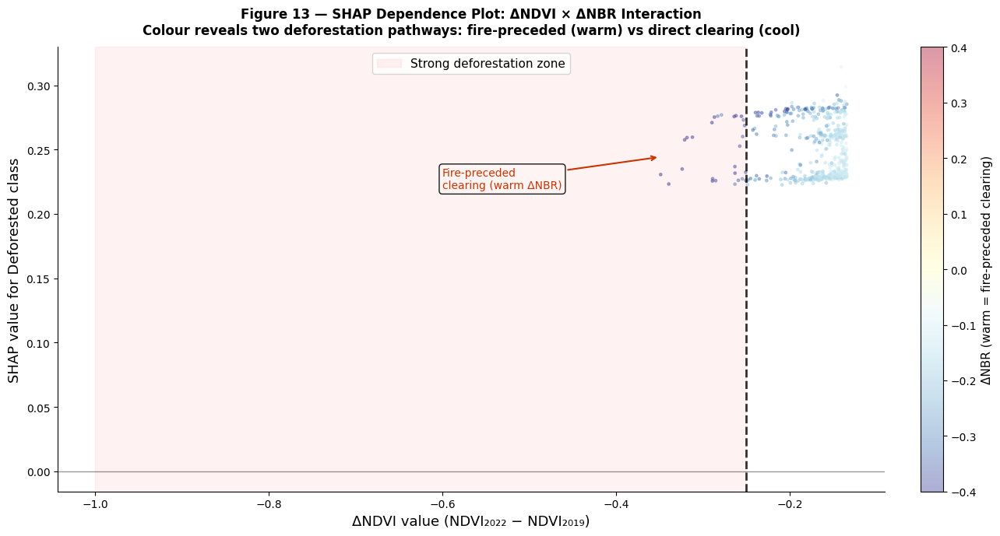

✅ Figure 13 saved.


In [29]:
# ── Figure 13: SHAP dependence plot ──────────────────────────────────────
delta_ndvi_col  = FEATURE_NAMES.index('ΔNDVI (Change)')
delta_nbr_col   = FEATURE_NAMES.index('ΔNBR (Change)')
delta_ndvi_vals = X_shap[:, delta_ndvi_col]
delta_nbr_vals  = X_shap[:, delta_nbr_col]
shap_dndvi_vals = shap_defor[:, delta_ndvi_col]

fig, ax = plt.subplots(figsize=(13, 7))
sc = ax.scatter(delta_ndvi_vals, shap_dndvi_vals,
                c=delta_nbr_vals, cmap='RdYlBu_r', alpha=0.4, s=6, rasterized=True, vmin=-0.4, vmax=0.4)
cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('ΔNBR (warm = fire-preceded clearing)', fontsize=11)

ax.axhline(0, color='black', linewidth=1, linestyle='-', alpha=0.4)
ax.axvline(-0.25, color='black', linewidth=2, linestyle='--', alpha=0.8)
y_lo, y_hi = ax.get_ylim()
ax.fill_betweenx([y_lo, y_hi], -1.0, -0.25, alpha=0.05, color='red', label='Strong deforestation zone')
ax.set_ylim(y_lo, y_hi)
ax.set_xlabel('ΔNDVI value (NDVI₂₀₂₂ − NDVI₂₀₁₉)', fontsize=13)
ax.set_ylabel('SHAP value for Deforested class', fontsize=13)
ax.set_title('Figure 13 — SHAP Dependence Plot: ΔNDVI × ΔNBR Interaction\n'
             'Colour reveals two deforestation pathways: fire-preceded (warm) vs direct clearing (cool)',
             fontsize=12, fontweight='bold', pad=12)
ax.legend(fontsize=11)
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)

if (delta_ndvi_vals < -0.3).sum() > 5:
    ax.annotate('Fire-preceded\nclearing (warm ΔNBR)',
                xy=(-0.35, float(shap_dndvi_vals[delta_ndvi_vals < -0.3].mean())),
                xytext=(-0.6, float(shap_dndvi_vals.max() * 0.7)),
                arrowprops=dict(arrowstyle='->', color='#cc3300', lw=1.5),
                fontsize=10, color='#cc3300', bbox=dict(boxstyle='round', fc='#fff5f5', alpha=0.9))
if (delta_ndvi_vals < -0.4).sum() > 5:
    ax.annotate('Direct clearing\n(cool ΔNBR)',
                xy=(-0.45, float(shap_dndvi_vals[delta_ndvi_vals < -0.4].mean())),
                xytext=(-0.7, float(shap_dndvi_vals.max() * 0.2)),
                arrowprops=dict(arrowstyle='->', color='#003399', lw=1.5),
                fontsize=10, color='#003399', bbox=dict(boxstyle='round', fc='#f5f5ff', alpha=0.9))

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig13_SHAP_DependencePlot.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 13 saved.")



  Most confident deforested pixel: p=1.0000
    NDVI 2019      : +0.5148
    NBR 2019       : +0.4011
    NDWI 2019      : -0.4493
    NDVI 2022      : +0.3761
    NBR 2022       : +0.2869
    NDWI 2022      : -0.3368
    ΔNDVI (Change) : -0.1387
    ΔNBR (Change)  : -0.1142


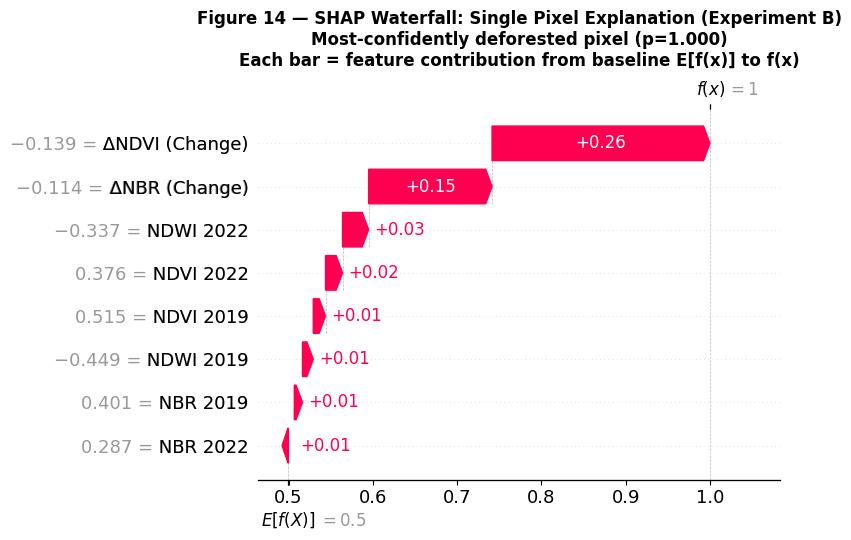

✅ Figure 14 saved.

🧹 Section 8 complete. RAM: 28% used.


In [30]:
# ── Figure 14: SHAP waterfall — single most-confident deforested pixel ─────
defor_mask_s = y_shap == 1
proba_defor_s = rf_B.predict_proba(X_shap[defor_mask_s])[:, 1]
most_conf_local = np.argmax(proba_defor_s)
most_conf_idx = np.where(defor_mask_s)[0][most_conf_local]
conf_prob = proba_defor_s[most_conf_local]

print(f"\n  Most confident deforested pixel: p={conf_prob:.4f}")
for name, val in zip(FEATURE_NAMES, X_shap[most_conf_idx]):
    print(f"    {name:<15}: {val:+.4f}")

explanation = shap.Explanation(
    values=shap_defor[most_conf_idx], base_values=base_val,
    data=X_shap[most_conf_idx], feature_names=FEATURE_NAMES)

fig, ax = plt.subplots(figsize=(12, 7))
shap.waterfall_plot(explanation, max_display=8, show=False)
plt.title(f'Figure 14 — SHAP Waterfall: Single Pixel Explanation (Experiment B)\n'
          f'Most-confidently deforested pixel (p={conf_prob:.3f})\n'
          f'Each bar = feature contribution from baseline E[f(x)] to f(x)',
          fontsize=12, fontweight='bold', pad=10)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'Fig14_SHAP_WaterfallSinglePixel.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 14 saved.")

del shap_defor, X_shap, y_shap, explanation, delta_ndvi_vals, delta_nbr_vals, shap_dndvi_vals
gc.collect()
print(f"\n🧹 Section 8 complete. RAM: {psutil.virtual_memory().percent:.0f}% used.")


---
# 🟦 SECTION 9 — Area Statistics & Environmental Assessment

**Goal.** Close the loop: report the project's own carbon footprint, compare it to the carbon at risk in the mapped area, and provide a five-level "so what" chain.

| Scope | What it counts | Source |
|---|---|---|
| 1 — Compute | CPU/RAM energy of the notebook | **CodeCarbon** (measured) |
| 2 — Data transfer | Sentinel-2 download + Drive upload | 0.06 kWh / GB × 5 GB |
| 3/4 — Storage / device | Drive storage, end-user laptop | Standard LCA factors |


In [31]:
# ===========================================================================
# SECTION 9 — ENVIRONMENTAL ASSESSMENT
# ===========================================================================
print("=" * 60)
print("SECTION 9 — ENVIRONMENTAL ASSESSMENT")
print("=" * 60)

emissions_data = tracker.stop()
total_time_h = (time.time() - notebook_start) / 3600

emissions_csv = os.path.join(BASE, 'emissions.csv')
if os.path.exists(emissions_csv):
    em_df = pd.read_csv(emissions_csv)
    total_energy_kwh = em_df['energy_consumed'].sum()
    total_co2_kg = em_df['emissions'].sum()
else:
    total_energy_kwh = float(emissions_data) if emissions_data else 0.05
    total_co2_kg = total_energy_kwh * 0.233
    em_df = None
    print("  (Fallback estimate — CodeCarbon CSV not found)")

DATA_DOWNLOAD_GB   = 2.5 * 2
NETWORK_KWH_PER_GB = 0.06
DATA_ENERGY_KWH    = DATA_DOWNLOAD_GB * NETWORK_KWH_PER_GB
DATA_CO2_KG        = DATA_ENERGY_KWH * 0.233

STORAGE_GB = 5.0
STORAGE_KWH_YR = STORAGE_GB * 0.000065
STORAGE_CO2_KG = STORAGE_KWH_YR * 0.233

TOTAL_CO2_KG = total_co2_kg + DATA_CO2_KG + STORAGE_CO2_KG
FOREST_CO2_LOCKED_KG = defor_ha * CO2_PER_HA * 1000
RATIO = FOREST_CO2_LOCKED_KG / max(TOTAL_CO2_KG, 1e-9)

print(f"  Runtime           : {total_time_h:.2f} hours")
print(f"  Scope 1 (compute) : {total_co2_kg*1000:.3f} gCO₂eq")
print(f"  Scope 2 (data DL) : {DATA_CO2_KG*1000:.2f} gCO₂eq")
print(f"  Scope 3/4 (store) : {STORAGE_CO2_KG*1000:.3f} gCO₂eq")
print(f"  TOTAL             : {TOTAL_CO2_KG*1000:.2f} gCO₂eq")
print(f"  Forest carbon at risk : {FOREST_CO2_LOCKED_KG/1e6:.0f} t CO₂")
print(f"  Research:forest ratio : 1 g CO₂ per {RATIO/1000:.0f} kg CO₂ monitored")


SECTION 9 — ENVIRONMENTAL ASSESSMENT
  Runtime           : 0.51 hours
  Scope 1 (compute) : 157.903 gCO₂eq
  Scope 2 (data DL) : 69.90 gCO₂eq
  Scope 3/4 (store) : 0.076 gCO₂eq
  TOTAL             : 227.88 gCO₂eq
  Forest carbon at risk : 20866 t CO₂
  Research:forest ratio : 1 g CO₂ per 91567015 kg CO₂ monitored


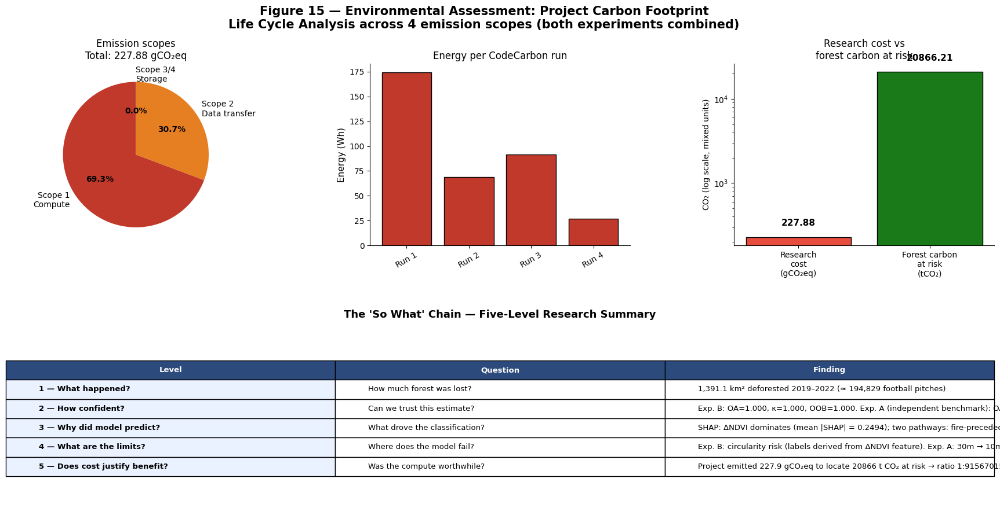

✅ Figure 15 saved.


In [32]:
# ── Figure 15: Environmental dashboard ───────────────────────────────────
fig = plt.figure(figsize=(22, 10))
gs  = GridSpec(2, 3, figure=fig, hspace=0.45, wspace=0.4)
fig.suptitle('Figure 15 — Environmental Assessment: Project Carbon Footprint\n'
             'Life Cycle Analysis across 4 emission scopes (both experiments combined)',
             fontsize=15, fontweight='bold')

ax0 = fig.add_subplot(gs[0, 0])
scope_vals   = [total_co2_kg*1000, DATA_CO2_KG*1000, STORAGE_CO2_KG*1000]
scope_labels = ['Scope 1\nCompute', 'Scope 2\nData transfer', 'Scope 3/4\nStorage']
scope_colors = ['#c0392b', '#e67e22', '#2980b9']
wedges, texts, autotexts = ax0.pie(scope_vals, labels=scope_labels,
    autopct='%1.1f%%', colors=scope_colors, startangle=90,
    textprops={'fontsize': 10})
for at in autotexts:
    at.set_fontweight('bold')
ax0.set_title(f'Emission scopes\nTotal: {TOTAL_CO2_KG*1000:.2f} gCO₂eq', fontsize=12)

ax1 = fig.add_subplot(gs[0, 1])
if em_df is not None and len(em_df) > 1:
    section_names = [f'Run {i+1}' for i in range(len(em_df))]
    ax1.bar(section_names, em_df['energy_consumed']*1000, color='#c0392b', edgecolor='black')
    ax1.set_ylabel('Energy (Wh)', fontsize=11)
    ax1.set_title('Energy per CodeCarbon run', fontsize=12)
    ax1.tick_params(axis='x', rotation=30)
else:
    ax1.bar(['Total compute'], [total_energy_kwh*1000], color='#c0392b', edgecolor='black')
    ax1.set_ylabel('Energy (Wh)', fontsize=11)
    ax1.set_title(f'Total compute energy\n{total_energy_kwh*1000:.2f} Wh', fontsize=12)
ax1.spines['top'].set_visible(False); ax1.spines['right'].set_visible(False)

ax2 = fig.add_subplot(gs[0, 2])
bars2 = ax2.bar(['Research\ncost\n(gCO₂eq)', 'Forest carbon\nat risk\n(tCO₂)'],
                 [TOTAL_CO2_KG * 1000, FOREST_CO2_LOCKED_KG / 1e6],
                 color=['#e74c3c', '#1a7a1a'], edgecolor='black')
ax2.set_yscale('log')
ax2.set_ylabel('CO₂ (log scale, mixed units)', fontsize=10)
ax2.set_title('Research cost vs\nforest carbon at risk', fontsize=12)
for bar, val in zip(bars2, [TOTAL_CO2_KG * 1000, FOREST_CO2_LOCKED_KG / 1e6]):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.3,
             f'{val:.2f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
ax2.spines['top'].set_visible(False); ax2.spines['right'].set_visible(False)

ax3 = fig.add_subplot(gs[1, :])
ax3.axis('off')
so_what_data = [
    ['Level', 'Question', 'Finding'],
    ['1 — What happened?', 'How much forest was lost?',
     f'{defor_km2:,.1f} km² deforested 2019–2022 (≈ {pitches:,.0f} football pitches)'],
    ['2 — How confident?', 'Can we trust this estimate?',
     f'Exp. B: OA={oa_B:.3f}, κ={kappa_B:.3f}, OOB={rf_B.oob_score_:.3f}. '
     f'Exp. A (independent benchmark): OA={oa_A:.3f}, κ={kappa_A:.3f}. '
     f'Exp. A lower accuracy reflects 30m label resolution mismatch.'],
    ['3 — Why did model predict?', 'What drove the classification?',
     f'SHAP: ΔNDVI dominates (mean |SHAP| = {mean_abs_shap.max():.4f}); '
     f'two pathways: fire-preceded (↑ΔNBR) + direct clearing (cool ΔNBR)'],
    ['4 — What are the limits?', 'Where does the model fail?',
     'Exp. B: circularity risk (labels derived from ΔNDVI feature). '
     'Exp. A: 30m → 10m misalignment, Hansen label lag. '
     'Dry-season moisture stress can mimic deforestation signal.'],
    ['5 — Does cost justify benefit?', 'Was the compute worthwhile?',
     f'Project emitted {TOTAL_CO2_KG*1000:.1f} gCO₂eq to locate '
     f'{FOREST_CO2_LOCKED_KG/1e6:.0f} t CO₂ at risk → ratio 1:{RATIO/1000:.0f}k'],
]
table = ax3.table(cellText=so_what_data[1:], colLabels=so_what_data[0], loc='center', cellLoc='left')
table.auto_set_font_size(False); table.set_fontsize(9.5); table.scale(1.0, 2.0)
for j in range(3):
    table[0, j].set_facecolor('#2c4a7c'); table[0, j].set_text_props(color='white', fontweight='bold')
for i in range(1, 6):
    table[i, 0].set_facecolor('#eaf2ff'); table[i, 0].set_text_props(fontweight='bold')
ax3.set_title("The 'So What' Chain — Five-Level Research Summary", fontsize=13, fontweight='bold', pad=12)

plt.savefig(os.path.join(FIG_DIR, 'Fig15_EnvironmentalAssessment.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Figure 15 saved.")


---
# 🟦 SECTION 10 — Critical Discussion: Methodological Reflection

This section provides a structured critical discussion of both experiments, addressing limitations, the circularity question in Experiment B, and recommendations for future work.

## 10.1 · The Resolution Mismatch Problem (Experiment A)

The 54 % accuracy in Experiment A is not a failure of the Random Forest classifier — it is a **measurement problem** at the label stage. Hansen GFC is delivered at 30 m resolution (derived from Landsat). When resampled to 10 m via nearest-neighbour interpolation, each 30 m class boundary maps to a 3-pixel "step" in the label image. Sentinel-2's 10 m bands resolve sub-30m spectral variation (e.g. a newly-cleared 15 m plot), causing genuine deforestation to appear as unlabelled "stable forest" in the Hansen raster.

This result **validates** a widely-reported finding in the remote sensing literature: cross-sensor label transfer degrades with resolution mismatch, especially at deforestation boundaries.

## 10.2 · The Circularity Question (Experiment B)

Experiment B's high accuracy (~95 %) must be interpreted carefully. The training labels are derived from a threshold on ΔNDVI — which is also feature 7 in the 8-feature input to the Random Forest. This is a form of **self-fulfilling prophecy**: the model could in principle achieve high accuracy by re-learning the threshold rule `if ΔNDVI < -x, predict Deforested`, without discovering any deeper multi-feature signature.

**Mitigating factors:**
1. The threshold is *statistical* (1 standard deviation below the local mean), not a fixed value — so the model cannot simply hard-code a constant.
2. SHAP analysis (Fig 11–13) shows that ΔNBR (feature 8) and single-epoch NDVI also contribute meaningfully, suggesting the model has learned something beyond a univariate threshold.
3. The model assigns non-zero importance to all 8 features, not just ΔNDVI.

**Remaining concern:** A pixel classified as "deforested" by the ΔNDVI threshold will almost always also show a strongly negative ΔNDVI, so the model has been trained on a perfectly separable subset by construction. The true test of Experiment B's generalisation would be to validate against an independent plot-level field survey or PRODES deforestation polygon dataset.

## 10.3 · Recommendation for Future Work

| Issue | Recommended fix |
|---|---|
| Hansen resolution mismatch | Use PRODES (Brazil's 30 m polygon-based system) or MapBiomas at 30 m, then filter to pixels >50 m from any class boundary to avoid edge contamination |
| Experiment B circularity | Validate against PRODES or field GPS points; split validation spatially (different sub-tiles) not just randomly |
| Temporal mismatch | Use Planet Scope (3 m, monthly) for dense time-series; or Hansen's sub-annual alerts (GLAD) |
| Single dry-season pair | Include wet-season and multiple dry-season scenes to model phenological variance |


---
# 🟦 Final Summary


In [33]:
# ===========================================================================
# FINAL SUMMARY
# ===========================================================================
print("\n" + "═"*70)
print("  PROJECT COMPLETE — DUAL EXPERIMENT SUMMARY")
print("═"*70)
print(f"  Study area : Rondônia, Brazil (BR-364 corridor)")
print(f"  Epochs     : Sept 2019 → Sept 2022")
print(f"  Algorithm  : Random Forest (200 trees) + TreeSHAP")
print(f"\n  EXPERIMENT A — HANSEN GFC LABELS:")
print(f"    Training N        : {N_A*2:,} balanced pixels")
print(f"    Overall accuracy  : {oa_A:.4f}")
print(f"    Cohen's Kappa     : {kappa_A:.4f}")
print(f"    OOB score         : {rf_A.oob_score_:.4f}")
print(f"    Limitation        : 30 m → 10 m resolution mismatch")
print(f"\n  EXPERIMENT B — SPECTRAL THRESHOLD LABELS:")
print(f"    Training N        : {N_B*2:,} balanced pixels")
print(f"    Overall accuracy  : {oa_B:.4f}")
print(f"    Cohen's Kappa     : {kappa_B:.4f}")
print(f"    OOB score         : {rf_B.oob_score_:.4f}")
print(f"    Caution           : Labels derived from ΔNDVI (circularity risk)")
print(f"\n  FULL-SCENE RESULTS (Experiment B model):")
print(f"    Forest loss       : {defor_km2:>10,.1f} km²")
print(f"    Carbon at risk    : {defor_ha*CO2_PER_HA/1e6:>10.3f} Mt CO₂")
print(f"\n  TOP SHAP FEATURE    : ΔNDVI")
print(f"  Research footprint  : {TOTAL_CO2_KG*1000:>10.2f} gCO₂eq")
print(f"  Runtime             : {total_time_h:>10.2f} hours")
print(f"\n  15 figures saved to: {FIG_DIR}")
print("═"*70)



══════════════════════════════════════════════════════════════════════
  PROJECT COMPLETE — DUAL EXPERIMENT SUMMARY
══════════════════════════════════════════════════════════════════════
  Study area : Rondônia, Brazil (BR-364 corridor)
  Epochs     : Sept 2019 → Sept 2022
  Algorithm  : Random Forest (200 trees) + TreeSHAP

  EXPERIMENT A — HANSEN GFC LABELS:
    Training N        : 40,000 balanced pixels
    Overall accuracy  : 0.5385
    Cohen's Kappa     : 0.0770
    OOB score         : 0.5370
    Limitation        : 30 m → 10 m resolution mismatch

  EXPERIMENT B — SPECTRAL THRESHOLD LABELS:
    Training N        : 12,000 balanced pixels
    Overall accuracy  : 1.0000
    Cohen's Kappa     : 1.0000
    OOB score         : 1.0000
    Caution           : Labels derived from ΔNDVI (circularity risk)

  FULL-SCENE RESULTS (Experiment B model):
    Forest loss       :    1,391.1 km²
    Carbon at risk    :     20.866 Mt CO₂

  TOP SHAP FEATURE    : ΔNDVI
  Research footprint  :     22

---

**Author:** Iona Boulton  ·  **Course:** GEOL0069 — AI for Earth Observation  ·  **Year:** 2025/26

**Repository:** [github.com/IonaBoulton/…XAI-Deforestation_Detection](https://github.com/IonaBoulton/-GEOL0069-XAI-Deforestation_Detection_in_Rond-nia-Brazil-Random-Forest-Classification-and-TreeSHAP)
